In [1]:
from bs4 import BeautifulSoup
import nbformat
from nbformat.v4 import output_from_msg
from nbconvert.preprocessors import ExecutePreprocessor
import markdown

# Lire le notebook
with open("Projet 5 Notebook Essais.ipynb") as f:
    nb = nbformat.read(f, as_version=4)

# Récupérer le contenu Markdown des cellules
md_content = ""
for cell in nb.cells:
    if cell.cell_type == "markdown":
        md_content += cell.source + "\n"

# Parser le contenu Markdown pour extraire les titres
html_content = markdown.markdown(md_content)
title_tags = ["h1", "h2", "h3", "h4", "h5", "h6"]
titles = [t.text for t in BeautifulSoup(html_content, "html.parser").find_all(title_tags)]

# Afficher les titres et créer un sommaire
print("Titres :")
for title in titles:
    print(title)

print("Sommaire :")
for i, title in enumerate(titles):
    print(f"{i+1}. {title}")


Titres :
Importation des librairies
Importation des jeux de données
Extraction des features
Preprocessing
Affichage des distributions
Standardisation
Standardisation par StandardScaler
Table de correlation heatmap
Segmentation
Test features numériques
Test avec 3 features
HCA
ACP à 2 dimensions
K-MEANS
Interpretation des clusters
Test avec 4 features
Segmentation
K-MEANS
Interpretation des clusters
Dataframe final
Test features numériques et catégorielles
Préparation des features catégorielles
Encodage des features
ACP des features Catégorielles
Filtrage Low Variance
Segmentation
HCA
ACP à 2 dimensions
K-MEANS
Interpretation des clusters
Heatmap
A partir des Kmedoids
Sauvegarde du modèle
DBSCAN avec jeu de données finales df_wk5
Echantillonage du jeu de données
Gaussian Mixture Model
Sommaire :
1. Importation des librairies
2. Importation des jeux de données
3. Extraction des features
4. Preprocessing
5. Affichage des distributions
6. Standardisation
7. Standardisation par StandardScal

# Sommaire :


1. Importation des librairies
2. Importation des jeux de données
3. Extraction des features
4. Preprocessing
5. Affichage des distributions
6. Standardisation
7. Standardisation par StandardScaler
8. Table de correlation heatmap
9. Segmentation
10. Test features numériques
11. Test avec 3 features
12. HCA
13. ACP à 2 dimensions
14. K-MEANS
15. Interpretation des clusters
16. Test avec 4 features
17. Segmentation
18. K-MEANS
19. Interpretation des clusters
20. Dataframe final
21. Test features numériques et catégorielles
22. Préparation des features catégorielles
23. Encodage des features
24. ACP des features Catégorielles
25. Filtrage Low Variance
26. Segmentation
27. HCA
28. ACP à 2 dimensions
29. K-MEANS
30. Interpretation des clusters
31. Heatmap
32. A partir des Kmedoids
33. Sauvegarde du modèle
34. DBSCAN avec jeu de données finales df_wk5
35. Echantillonage du jeu de données
36. Gaussian Mixture Model

## Importation des librairies

In [2]:
# importation des librairies
import sys

import numpy as np
import warnings
import scipy.stats as stats
import pandas as pd
import matplotlib as mpl
import seaborn as sns
import sklearn
import plotly.express as px
import matplotlib.cm as cm
import altair as alt
import outils_analyses
import re
import os
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from math import ceil
from math import pi
from sklearn_extra.cluster import KMedoids
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score, davies_bouldin_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, PowerTransformer, normalize
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform

# Où sauvegarder les visualisations
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "unsupervised_learning"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

# Versions
print('Vérification de la mise à jour des librairies utilisées :')
print('Python: {}'.format(sys.version))
print('NumPy         : ' + np.version.full_version)
print('Pandas        : ' + pd.__version__)
print('Matplotlib    : ' + mpl.__version__)
print('Seaborn       : ' + sns.__version__)
print('sklearn       : ' + sklearn.__version__)

import datetime
now  = datetime.datetime.now().isoformat()
print('Lancé le      : ' + now)

Vérification de la mise à jour des librairies utilisées :
Python: 3.10.9 (main, Jan 11 2023, 09:18:20) [Clang 14.0.6 ]
NumPy         : 1.23.5
Pandas        : 1.5.3
Matplotlib    : 3.7.1
Seaborn       : 0.12.2
sklearn       : 1.2.1
Lancé le      : 2023-05-05T10:34:56.581785


In [3]:
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [4]:
def calc_clust(table, grappe):
    for i in grappe:
        print('n_clusters =',i)
    table['cluster_number_for_'+str(i)+'_clusters'] = \
        pd.DataFrame(data=KMeans(n_clusters=i).fit(table).labels_,
                     index=table.index)


In [5]:
def distribution(dataset):
    warnings.filterwarnings('ignore')

    sns.set_context("talk")  # scaling automatique selon type de présentation ('notebook', 'paper', 'talk', 'poster')

    sns.set_style("whitegrid")
    fig = plt.figure(figsize=(21, 30))

    sub = 0
    for i in range(len(dataset)):
        fig.add_subplot(len(dataset) // 3 + 1, 3, i + 1)

        left, width = 0, 1
        bottom, height = 0, 1
        right = left + width
        top = bottom + height

        colonne = dataset[i]
        kstest = stats.kstest(data_train[colonne].notnull(), 'norm')
        ax = sns.distplot(data_train[colonne], fit=stats.norm, kde=False)
        ax.set_title("Distribution vs loi normale : {}".format(colonne))
        ax.text(right, top, 'Test Kolmogorov-Smirnov \n Pvalue: {:.2} \n Stat: {:.2}'.format(kstest.pvalue,
                                                                                             kstest.statistic),
                horizontalalignment='right',
                verticalalignment='top',
                style='italic', transform=ax.transAxes, fontsize=12,
                bbox={'facecolor': '#00afe6', 'alpha': 0.5, 'pad': 0})
        sub += 1

        fig.tight_layout()

    plt.show()

def scores(df):
    """grappes : mettre les valeurs entre crochets = [] et les séparer par des virgules"""

    km = KMeans(random_state=42)
    visualizer = KElbowVisualizer(km, k=(1, 10))

    visualizer.fit(df)  # Adaptation des données au visualiseur
    visualizer.show()  # Affichage du plot

    SK = range(2, 10)
    sil_score = []
    for i in SK:
        labels = KMeans(n_clusters=i, init="k-means++", random_state=200).fit(df).labels_
        score = silhouette_score(df, labels, metric="euclidean", sample_size=1000, random_state=200)
        sil_score.append(score)
        print("Silhouette score pour k(clusters) = " + str(i) + " est "
              + str(silhouette_score(df, labels, metric="euclidean", sample_size=1000, random_state=200)))

    sil_centers = pd.DataFrame({'Clusters': SK, 'Sil Score': sil_score})
    display(sil_centers)

    model = KMeans()
    visualizer = KElbowVisualizer(model,
                                  k=(2, 10),
                                  metric='silhouette',
                                  timings=True)

    visualizer.fit(df)
    visualizer.poof()

    # Score Calinski Harabasz pour le Kmean
    model = KMeans()
    # k is range of number of clusters.
    visualizer = KElbowVisualizer(model, k=(2,30),metric='calinski_harabasz', timings= True)
    visualizer.fit(df)        # Fit the data to the visualizer
    visualizer.show()

    km_db_score = []
    results = {}
    for i in range(2, 11):
        km = KMeans(n_clusters=i, random_state=1301).fit(df)
        preds = km.predict(df)
        db = davies_bouldin_score(df, preds)
        km_db_score.append(db)
        print(f'Score Davies Bouldin pour {i} clusters : {db:.3f}')
        results.update({i: db})

    plt.plot(list(results.keys()), list(results.values()))
    plt.xlabel("Nombre de clusters")
    plt.ylabel("Index Davies-Boulding")
    plt.show()

def silhouettes(dataset, grappes):
    """grappes : mettre les valeurs entre crochets = [] et les séparer par des virgules"""
    # Génération de données d'échantillon à partir de make_blobs
    # Ce réglage particulier a un cluster distinct et 3 clusters placés à proximité les uns des autres.

    dataset, y = make_blobs(
        n_samples=500,
        n_features=2,
        centers=4,
        cluster_std=1,
        center_box=(-10.0, 10.0),
        shuffle=True,
        random_state=1,
    )  # For reproducibility

    range_n_clusters = grappes

    for n_clusters in range_n_clusters:
        # Ccreation d'un subplot avec 1 ou 2 colonnes
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # Le premier subplot est le score silhouette
        # Le coefficient de silhouette peut varier de -1 à 1
        ax1.set_xlim([-0.1, 1])
        # Le (n_clusters+1)*10 sert à insérer un espace vide entre 
        # les graphiques de silhouette des clusters individuels, 
        # pour les délimiter clairement.
        ax1.set_ylim([0, len(dataset) + (n_clusters + 1) * 10])

        # Initialiser le clustering avec la valeur de n_clusters 
        # et un random seed de 10 pour assurer la reproductibilité.
        clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
        cluster_labels = clusterer.fit_predict(dataset)

        # Le silhouette_score donne la valeur moyenne pour tous les échantillons. 
        # Cela donne une perspective sur la densité et la séparation des clusters 
        # formés.
        silhouette_avg = silhouette_score(dataset, cluster_labels)
        print(
            "Pour n_clusters =",
            n_clusters,
            "Le score Silhouette moyen est :",
            silhouette_avg,
        )

        # Calcul du score silhouette pour chaque echantillon
        sample_silhouette_values = silhouette_samples(dataset, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Regrouper les scores de silhouette pour 
            # les échantillons appartenant au cluster i et les trier.
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Étiquette les graphiques de silhouette avec les numéros de cluster
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # calcul du nouveau y_lower
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("Score de silhouette pour les différents clusters")
        ax1.set_xlabel("Valeur des coefficients de silhouette")
        ax1.set_ylabel("Clusters")

        # Ligne verticale pour le score de silhouette moyen de toutes les valeurs.
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # Deuxième graphique montrant les clusters formés
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
            dataset[:, 0], dataset[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )

        # Label des clusters
        centers = clusterer.cluster_centers_
        # Dessine un cercle pour les centres
        ax2.scatter(
            centers[:, 0],
            centers[:, 1],
            marker="o",
            c="white",
            alpha=1,
            s=200,
            edgecolor="k",
        )

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("La visualisation des données.")
        ax2.set_xlabel("Première caractéristique")
        ax2.set_ylabel("Seconde caractéristique")

        plt.suptitle(
            "Analyse de silhouette pour KMeans sur des données d'échantillon avec n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()


In [6]:
#réglage de l'affichage de données
pd.set_option('display.max_row',250)
pd.set_option('display.max_column',70)
pd.set_option('display.precision', 5)


## Importation des jeux de données

In [7]:
#Importation du jeu de données d'entrainement
missing_values = ["n/a", "na", "--","nan","NaN"]
data_clean  = pd.read_csv('fr_data_train.csv', decimal=".", index_col=0, encoding='utf_8', low_memory=False,na_values = missing_values).reset_index()

In [8]:
data_clean.head()

,customer_unique_id,Recency,Frequency_sf_Log,Monetary_sf_Log,customer_zip_code_prefix,city,customer_state,order_purchase_timestamp,payment_value,payment_type,payment_installments,review_score,price,product_category_name,order_purchase_hour,order_purchase_time_day,order_purchase_dayofweek,nb_articles
0,0000f6ccb0745a6a4b88665a16c9f078,231,0.0,3.79818,66812,belem,PA,2017-10-12,43.62,credit_card,4.0,4.0,25.99,electronics,20,Soiree,Thu,1
1,0004aac84e0df4da2b147fca70cf8255,198,0.0,5.28771,18040,sorocaba,SP,2017-11-14,196.89,credit_card,6.0,5.0,180.00,electronics,19,Soiree,Tue,1
2,0004bd2a26a76fe21f786e4fbd80607f,56,0.0,5.12384,5036,sao paulo,SP,2018-04-05,166.98,credit_card,8.0,4.0,154.00,tools,19,Soiree,Thu,1
3,00050ab1314c0e55a6ca13cf7181fecf,41,0.0,3.59402,13084,campinas,SP,2018-04-20,35.38,boleto,1.0,4.0,27.99,electronics,12,Nuit,Fri,1
4,00053a61a98854899e70ed204dd4bafe,92,0.0,6.04068,80410,curitiba,PR,2018-02-28,419.18,credit_card,3.0,1.0,191.00,auto_leisure,11,Nuit,Wed,2


#### Extraction des features

In [9]:
#Extraction des features numériques
data_train = data_clean.astype({"order_purchase_hour" :'object', "customer_zip_code_prefix" : 'object', "review_score" : 'object', "payment_installments" : 'object', \
                                "nb_articles" : 'object' })
numerical_features = data_train.select_dtypes(exclude='object')

In [10]:
display(numerical_features)

,Recency,Frequency_sf_Log,Monetary_sf_Log,payment_value,price
0,231,0.0,3.79818,43.62,25.99
1,198,0.0,5.28771,196.89,180.00
2,56,0.0,5.12384,166.98,154.00
3,41,0.0,3.59402,35.38,27.99
4,92,0.0,6.04068,419.18,191.00
...,...,...,...,...,...
64062,-76,0.0,4.16542,63.42,45.00
64063,213,0.0,4.40916,81.20,64.99
64064,165,0.0,4.30622,73.16,58.00
64065,357,0.0,7.63454,2067.42,680.00


In [11]:
#Extraction des features catégoriques
categorical_features = data_train.select_dtypes(include='object')

In [12]:
display(categorical_features)

,customer_unique_id,customer_zip_code_prefix,city,customer_state,order_purchase_timestamp,payment_type,payment_installments,review_score,product_category_name,order_purchase_hour,order_purchase_time_day,order_purchase_dayofweek,nb_articles
0,0000f6ccb0745a6a4b88665a16c9f078,66812,belem,PA,2017-10-12,credit_card,4.0,4.0,electronics,20,Soiree,Thu,1
1,0004aac84e0df4da2b147fca70cf8255,18040,sorocaba,SP,2017-11-14,credit_card,6.0,5.0,electronics,19,Soiree,Tue,1
2,0004bd2a26a76fe21f786e4fbd80607f,5036,sao paulo,SP,2018-04-05,credit_card,8.0,4.0,tools,19,Soiree,Thu,1
3,00050ab1314c0e55a6ca13cf7181fecf,13084,campinas,SP,2018-04-20,boleto,1.0,4.0,electronics,12,Nuit,Fri,1
4,00053a61a98854899e70ed204dd4bafe,80410,curitiba,PR,2018-02-28,credit_card,3.0,1.0,auto_leisure,11,Nuit,Wed,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
64062,fff96bc586f78b1f070da28c4977e810,13309,itu,SP,2018-08-15,credit_card,2.0,4.0,housewares,10,Nuit,Wed,1
64063,fffa431dd3fcdefea4b1777d114144f2,28660,bom jardim,RJ,2017-10-30,boleto,1.0,5.0,other,20,Soiree,Mon,1
64064,fffb09418989a0dbff854a28163e47c6,95330,veranopolis,RS,2017-12-17,boleto,1.0,5.0,fashion,19,Soiree,Sun,1
64065,fffcf5a5ff07b0908bd4e2dbc735a684,55250,sanharo,PE,2017-06-08,credit_card,10.0,5.0,hygiene_and_beauty,21,Soiree,Thu,2


In [13]:
df_wk = numerical_features

## Preprocessing

### Affichage des distributions

In [14]:
cols = ['Recency', 'Frequency_sf_Log', 'Monetary_sf_Log']

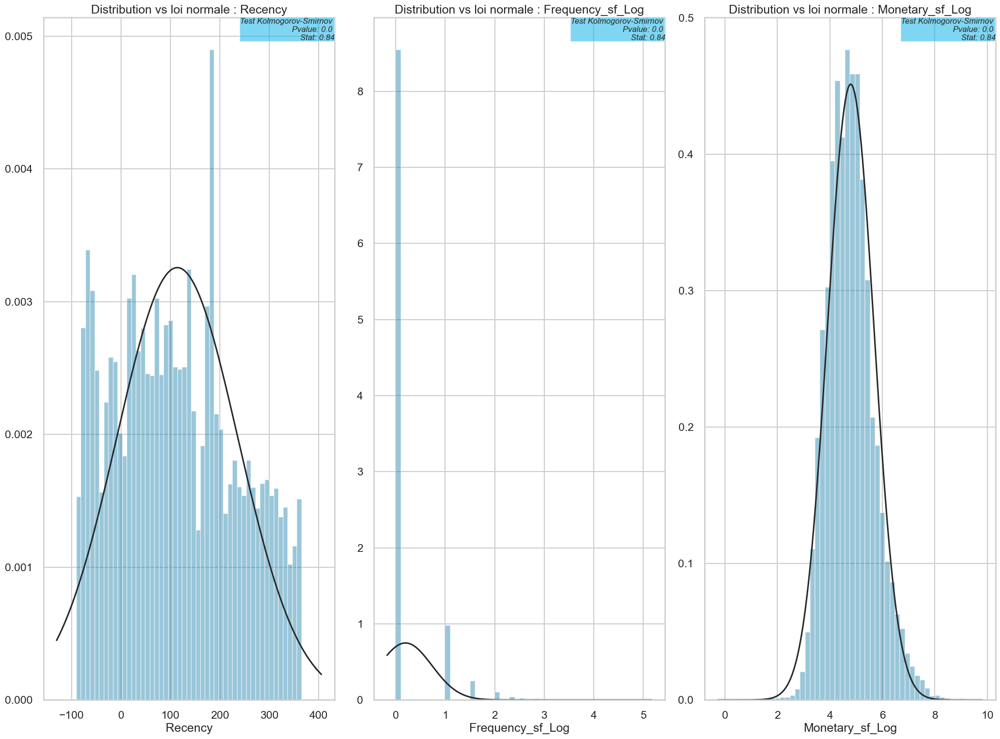

In [15]:
distribution(cols)

In [16]:
# Valeurs négatives ?
data_train[['Recency', 'Frequency_sf_Log', 'Monetary_sf_Log']] \
    .describe()

,Recency,Frequency_sf_Log,Monetary_sf_Log
count,64067.00000,64067.00000,64067.00000
mean,113.73681,0.19588,4.79214
std,122.52217,0.53290,0.88400
min,-90.00000,0.00000,0.00995
25%,15.00000,0.00000,4.17592
50%,106.00000,0.00000,4.73786
75%,202.00000,0.00000,5.29962
max,365.00000,5.00000,9.52260



### Standardisation

### Standardisation par StandardScaler

In [17]:
# Standardisation StandardScaler
# -----------------------------------------------------------------------
scaler = PowerTransformer()
df_rfm_scaled = scaler.fit_transform(numerical_features)
# Dataframe
df_rfm_scaled = pd.DataFrame(df_rfm_scaled, index=numerical_features.index,
                             columns=numerical_features.columns)

In [18]:
df_rfm_scaled = pd.DataFrame(data = df_rfm_scaled, columns = df_wk.columns)

In [19]:
df_rfm_scaled.describe()

,Recency,Frequency_sf_Log,Monetary_sf_Log,payment_value,price
count,6.40670e+04,6.40670e+04,6.40670e+04,6.40670e+04,6.40670e+04
mean,-1.05361e-17,2.48430e-17,-2.00696e-15,-5.78709e-16,4.56102e-17
std,1.00001e+00,1.00001e+00,1.00001e+00,1.00001e+00,1.00001e+00
min,-2.05171e+00,-4.13245e-01,-8.93213e+00,-4.76098e+00,-5.14668e+00
25%,-6.77114e-01,-4.13245e-01,-6.74744e-01,-6.34632e-01,-6.67930e-01
50%,3.37855e-02,-4.13245e-01,-8.31175e-03,-1.63408e-02,5.29491e-02
75%,7.28383e-01,-4.13245e-01,6.13361e-01,5.87097e-01,6.73252e-01
max,1.85531e+00,2.42656e+00,4.35094e+00,5.95947e+00,3.75528e+00


Les distributions ont été normalisées, nous pouvons donc utiliser le StandardScaler.

## Table de correlation heatmap

In [20]:
df_rfm_scaled.corr()

,Recency,Frequency_sf_Log,Monetary_sf_Log,payment_value,price
Recency,1.00000,0.01813,-0.00793,-0.02406,-0.00330
Frequency_sf_Log,0.01813,1.00000,0.28393,-0.10959,-0.05741
Monetary_sf_Log,-0.00793,0.28393,1.00000,0.86858,0.78723
payment_value,-0.02406,-0.10959,0.86858,1.00000,0.81107
price,-0.00330,-0.05741,0.78723,0.81107,1.00000


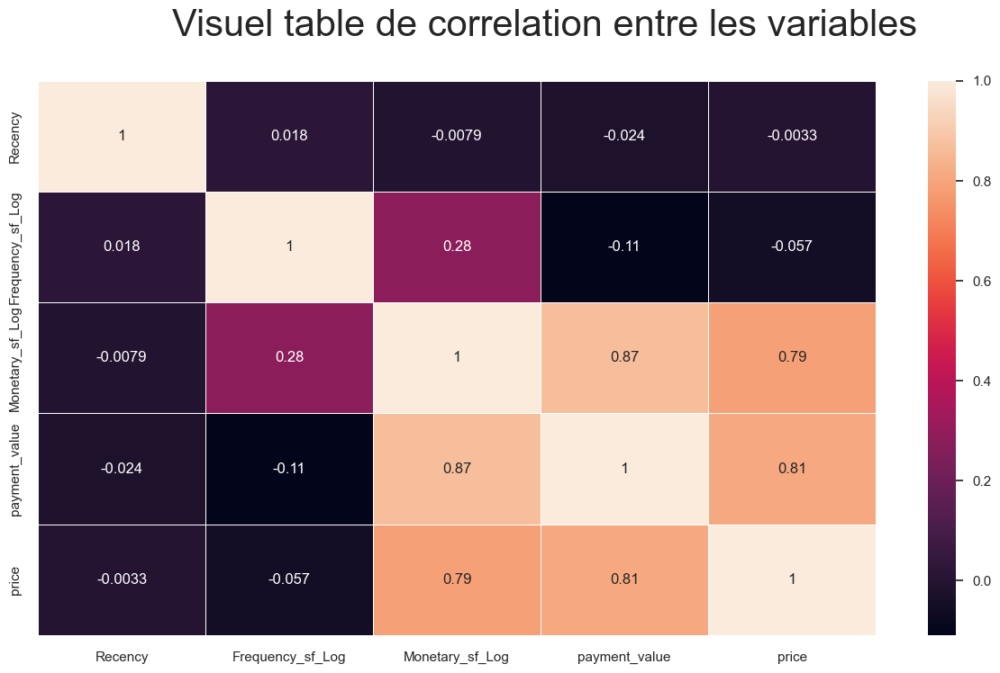

In [21]:
#On donne un aspect graphique à nos valeurs de corrélation
fig = plt.figure(figsize=(15,8))
fig.suptitle('Visuel table de correlation entre les variables', fontsize=30)

df_rfm_scaled.corr()
sns.set(font_scale=1)
ax = sns.heatmap(df_rfm_scaled.corr(), linewidths=.5, annot = True)

## Segmentation

Suite à la segmentation réaliser précédemment, nous allons utiliser la segmentation RFM.

## Test features numériques

### Test avec 3 features

Nous utiliserons dans un premier temps les features Recency, Frequency et Monetary
Pour ce faire nous allons créer le dataframe de travail, ainsi qu'un dataframe contenant les données non standardisées, pour les boxplots.

In [22]:
df_wk3 = df_rfm_scaled[['Recency', 'Frequency_sf_Log', 'Monetary_sf_Log']]
df_wk3_no_std = data_train[['Recency', 'Frequency_sf_Log', 'Monetary_sf_Log']]

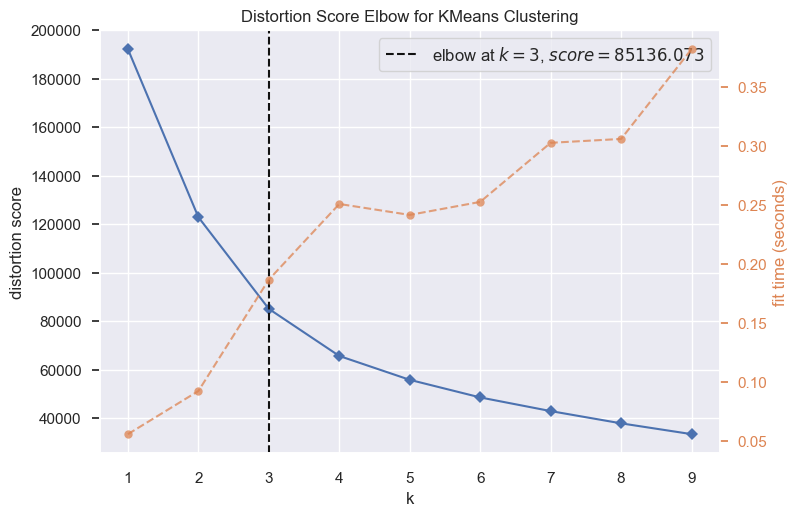

Silhouette score pour k(clusters) = 2 est 0.5070905317862707
Silhouette score pour k(clusters) = 3 est 0.36156150327695424
Silhouette score pour k(clusters) = 4 est 0.35021309385118954
Silhouette score pour k(clusters) = 5 est 0.32888682001923153
Silhouette score pour k(clusters) = 6 est 0.32144143614713855
Silhouette score pour k(clusters) = 7 est 0.3172621242962021
Silhouette score pour k(clusters) = 8 est 0.32694029745018965
Silhouette score pour k(clusters) = 9 est 0.32680245381986806


,Clusters,Sil Score
0,2,0.50709
1,3,0.36156
2,4,0.35021
3,5,0.32889
4,6,0.32144
5,7,0.31726
6,8,0.32694
7,9,0.32680


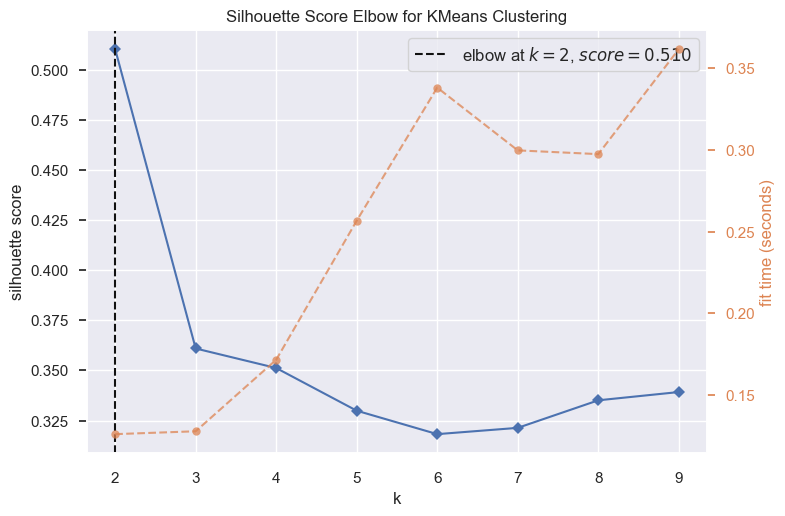

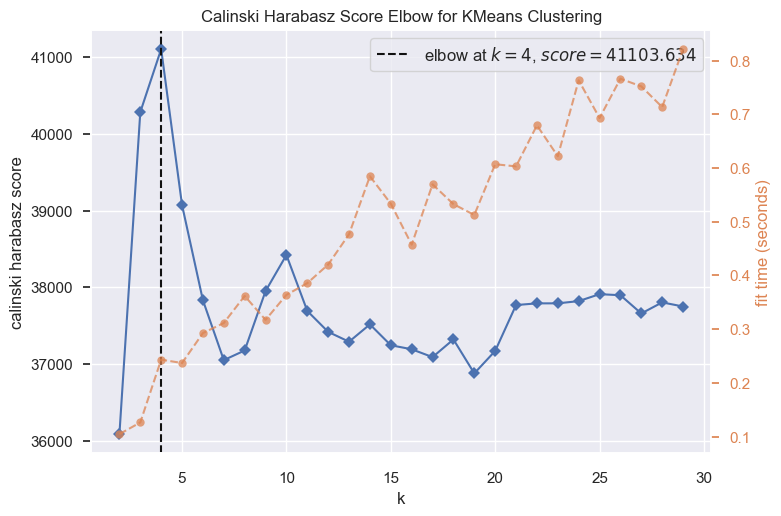

Score Davies Bouldin pour 2 clusters : 0.865
Score Davies Bouldin pour 3 clusters : 1.011
Score Davies Bouldin pour 4 clusters : 0.904
Score Davies Bouldin pour 5 clusters : 0.924
Score Davies Bouldin pour 6 clusters : 1.048
Score Davies Bouldin pour 7 clusters : 1.002
Score Davies Bouldin pour 8 clusters : 0.925
Score Davies Bouldin pour 9 clusters : 0.869
Score Davies Bouldin pour 10 clusters : 0.868


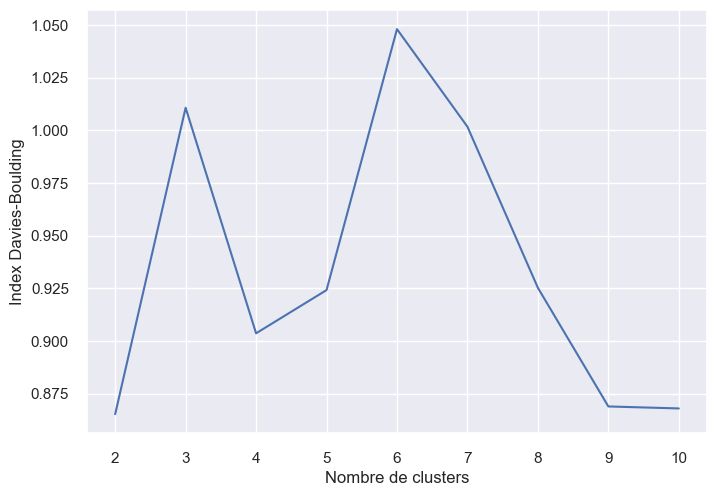

In [23]:
scores(df_wk3)

Les valeurs du coefficient de silhouette varient significativement.
Les valeurs de K les plus optimisées sont 3 et 4 clusters

Le visualiseur de silhouette affiche le coefficient de silhouette pour chaque cluster,
en évaluant visuellement leur densité et leur séparation par rapport aux autres clusters.

Le modèle à 3 clusters est moins homogènes qu'avec 4 clusters.

Il nous semble plus pertinent de partitionner nos clients en 4 ou 5 clusters. Nous observerons toutefois les hypothèses à 4, 5, 6, et 9 clusters


In [24]:
df_wk3_pca = df_wk3[['Recency', 'Frequency_sf_Log', 'Monetary_sf_Log']]
for i in[4,5,6,9]:
    print('n_clusters =',i)
    df_wk3_pca['cluster_number_for_'+str(i)+'_clusters'] = \
        pd.DataFrame(data=KMeans(n_clusters=i).fit(df_wk3_pca).labels_,
                     index=df_wk3.index)

n_clusters = 4
n_clusters = 5
n_clusters = 6
n_clusters = 9


#### HCA

Nous utilisons un échantillon randomisé pour des raison de couts.

In [25]:
df_wk3_sample = df_wk3.sample(n=5000, random_state=42)

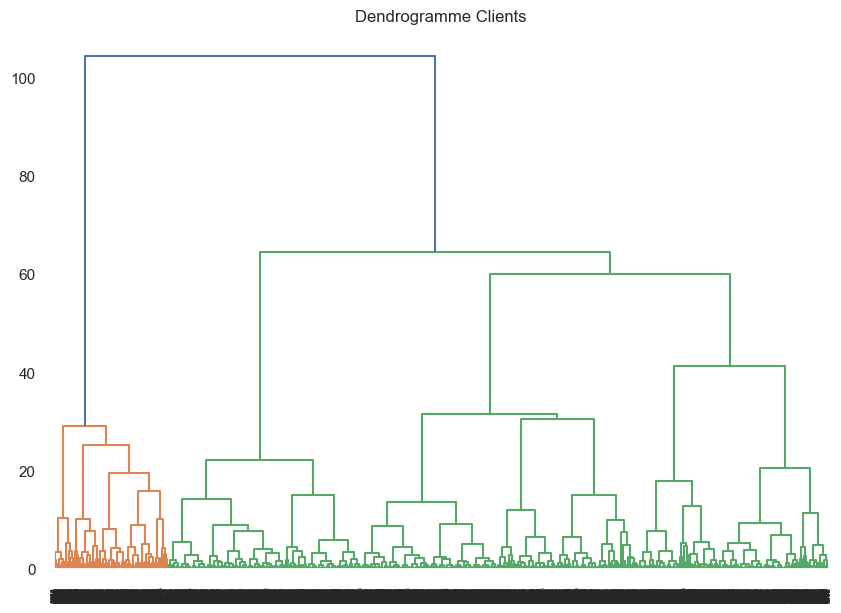

In [26]:
plt.figure(figsize=(10, 7))
plt.title("Dendrogramme Clients")

# Selection du nombre de consommateur
selected_data = df_wk3_sample
clusters = sch.linkage(selected_data,
                       method='ward',
                       metric="euclidean")
sch.dendrogram(Z=clusters)
plt.show()

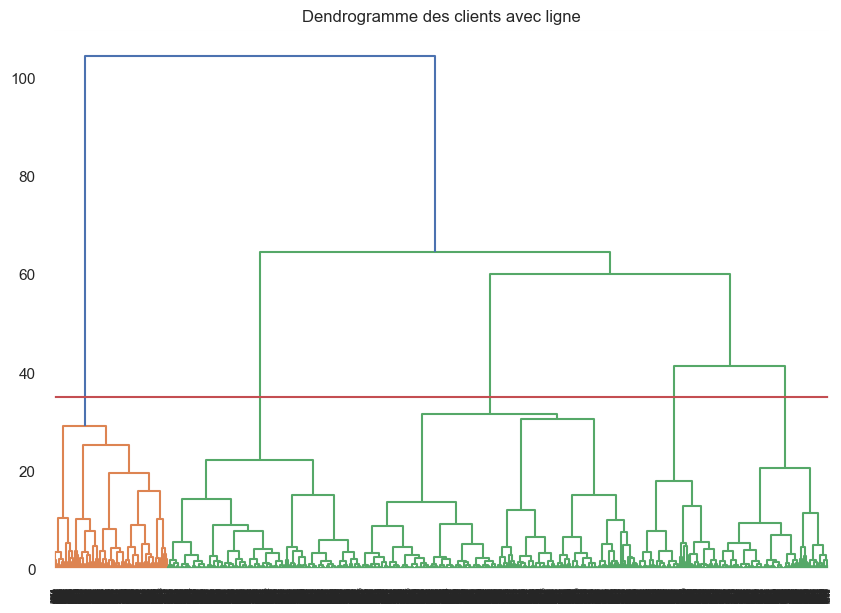

In [27]:
plt.figure(figsize=(10, 7))
plt.title("Dendrogramme des clients avec ligne")
clusters = sch.linkage(selected_data,
                       method='ward',
                       metric="euclidean")
sch.dendrogram(clusters)
plt.axhline(y = 35, color = 'r', linestyle = '-')

Le dendrogramme nous donne un score à 5 clusters

#### ACP à 2 dimensions

In [28]:
X = numerical_features
X_scaled = df_wk3_pca
all_features = X.columns

In [29]:
twod_pca = PCA(n_components=2)
X_pca = twod_pca.fit_transform(X_scaled)

In [30]:
df_wk3_pca['pca1'] = X_pca[:,0]
df_wk3_pca['pca2'] = X_pca[:,1]

In [31]:
df_wk3_pca

,Recency,Frequency_sf_Log,Monetary_sf_Log,cluster_number_for_4_clusters,cluster_number_for_5_clusters,cluster_number_for_6_clusters,cluster_number_for_9_clusters,pca1,pca2
0,0.93272,-0.41325,-1.15197,3,1,0,2,0.45113,-2.92014
1,0.70003,-0.41325,0.60060,1,0,2,0,-2.66089,-2.75944
2,-0.34556,-0.41325,0.42320,1,0,2,5,1.48303,-0.17461
3,-0.46362,-0.41325,-1.42102,3,1,0,7,4.59068,-0.22036
4,-0.07074,-0.41325,1.37629,1,0,2,5,1.40055,-0.18279
...,...,...,...,...,...,...,...,...,...
64062,-1.84667,-0.41325,-0.68767,0,4,1,4,0.19435,1.97531
64063,0.80613,-0.41325,-0.39224,3,1,0,2,0.37228,-2.80498
64064,0.46444,-0.41325,-0.51583,3,1,0,7,4.53765,-0.46294
64065,1.80104,-0.41325,2.84292,1,0,2,5,1.32859,-0.70541


In [32]:
df_wk3_pca['member'] = 1
df_wk3_pca.groupby('cluster_number_for_5_clusters')['member'].transform('count').div(df_wk3.shape[0])

0        0.28214
1        0.27743
2        0.27743
3        0.28214
4        0.27743
          ...   
64062    0.29460
64063    0.28214
64064    0.28214
64065    0.27743
64066    0.28214
Name: member, Length: 64067, dtype: float64

In [33]:
selection = alt.selection_multi(fields=['cluster_number_for_5_clusters'], bind='legend')

df_wk3_pca['cluster_number_for_5_clusters_weight'] = df_wk3_pca['cluster_number_for_5_clusters'].map(df_wk3_pca['cluster_number_for_5_clusters'].value_counts(normalize=True).to_dict())
# Draw 20% stratified sample
alt.Chart(df_wk3_pca.sample(1000, weights='cluster_number_for_5_clusters_weight')).mark_circle(size=60).encode(
    x=alt.X('pca1', title='First component'),
    y=alt.Y('pca2', title='Second component'),
    color=alt.Color('cluster_number_for_5_clusters:N'),
    tooltip=['cluster_number_for_5_clusters'],
    opacity=alt.condition(selection, alt.value(1), alt.value(0.2))
).properties(
    title='PCA analyse',
    width=600,
    height=400
).add_selection(
    selection
)

alt.Chart(...)

In [34]:
df_wk3_pca['member'] = 1
df_wk3_pca.groupby('cluster_number_for_9_clusters')['member'].transform('count').div(df_wk3.shape[0])

0        0.13954
1        0.15929
2        0.11814
3        0.14260
4        0.11814
          ...   
64062    0.13178
64063    0.13954
64064    0.14260
64065    0.11814
64066    0.13954
Name: member, Length: 64067, dtype: float64

In [35]:
selection = alt.selection_multi(fields=['cluster_number_for_9_clusters'], bind='legend')

df_wk3_pca['cluster_number_for_9_clusters_weight'] = df_wk3_pca['cluster_number_for_9_clusters'].map(df_wk3_pca['cluster_number_for_9_clusters'].value_counts(normalize=True).to_dict())
# Echantillon stratifié de 20%.
alt.Chart(df_wk3_pca.sample(1000, weights='cluster_number_for_9_clusters_weight')).mark_circle(size=60).encode(
    x=alt.X('pca1', title='First component'),
    y=alt.Y('pca2', title='Second component'),
    color=alt.Color('cluster_number_for_9_clusters:N'),
    tooltip=['cluster_number_for_9_clusters'],
    opacity=alt.condition(selection, alt.value(1), alt.value(0.2))
).properties(
    title='PCA analyse',
    width=600,
    height=400
).add_selection(
    selection
)

alt.Chart(...)

#### K-MEANS

Pour n_clusters = 4 Le score Silhouette moyen est : 0.6505186632729437
Pour n_clusters = 5 Le score Silhouette moyen est : 0.5662344175321901
Pour n_clusters = 6 Le score Silhouette moyen est : 0.43582979891562834
Pour n_clusters = 9 Le score Silhouette moyen est : 0.38378664890664654


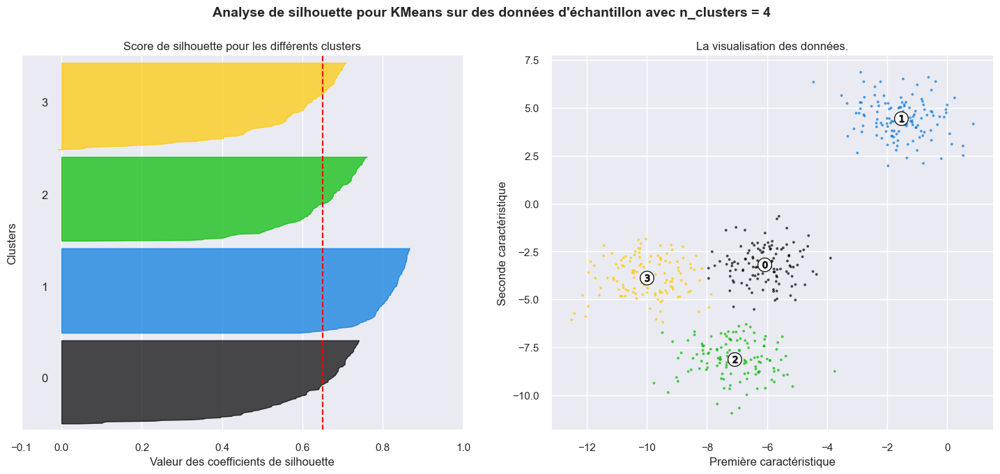

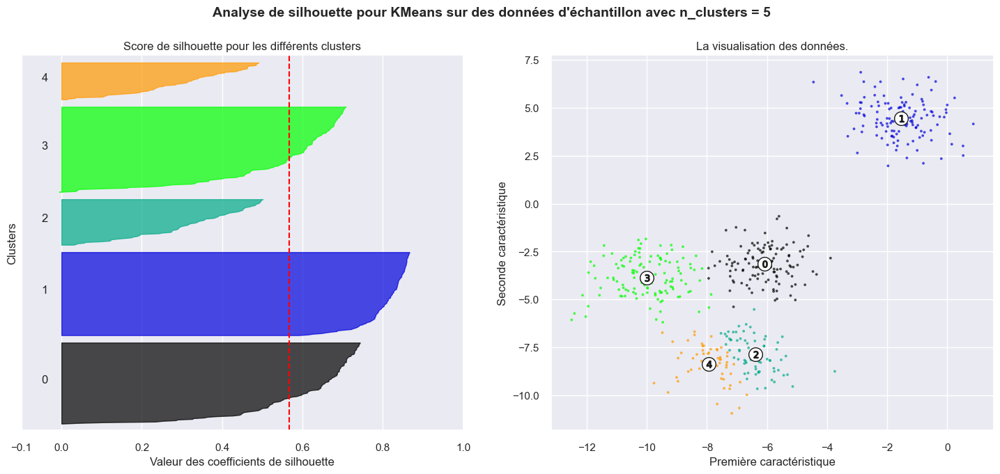

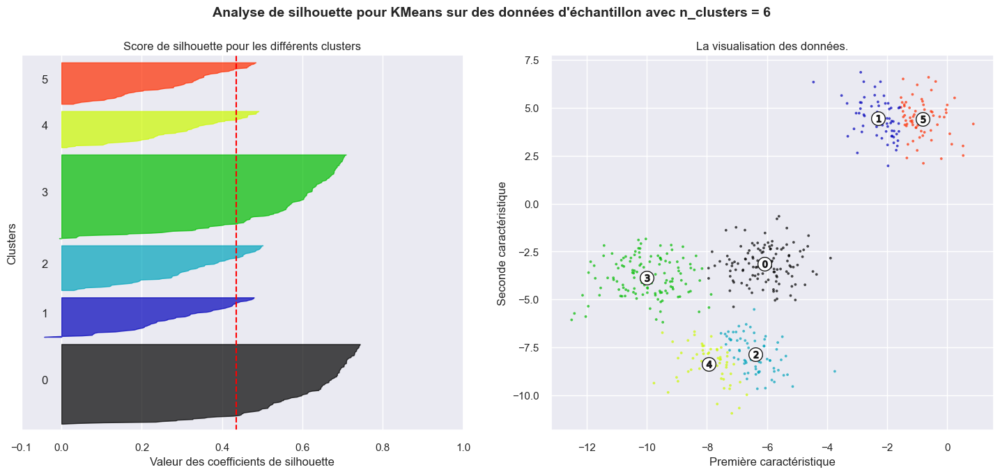

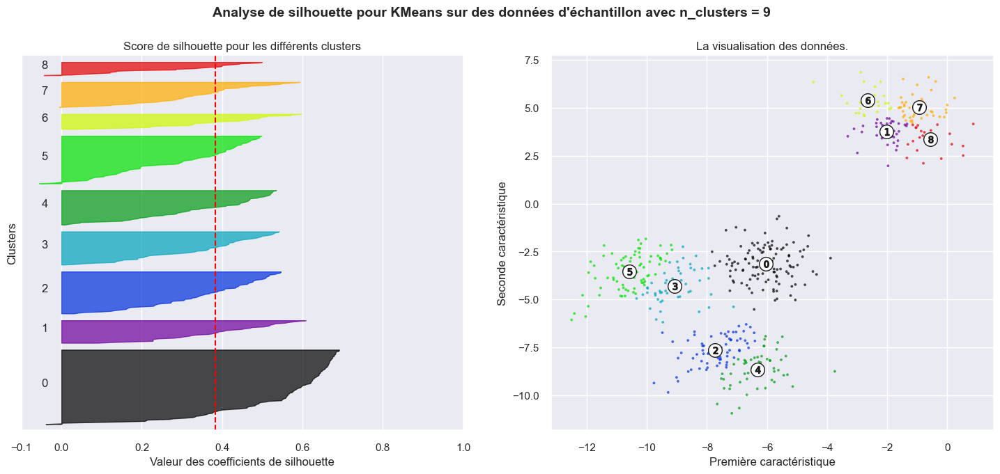

In [36]:
silhouettes(df_wk3_pca, [4,5,6,9])

Les modèles les mieux adaptés semblent être les modèles à 4 et 9 clusters.

#### Affichages des clusters Kmeans

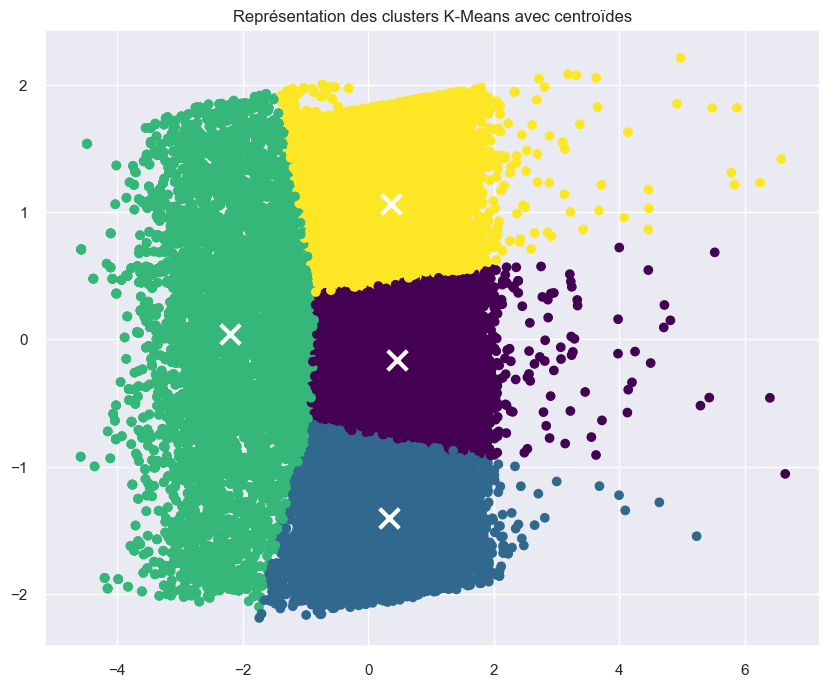

In [37]:
# Charger les données et normaliser les variables
df = df_wk3
df_norm = (df - df.mean()) / df.std()

# Appliquer PCA pour réduire la dimensionnalité des données à 2
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_norm)
df_pca = pd.DataFrame(df_pca, columns=['PC1', 'PC2'])

# Appliquer K-Means pour obtenir les segments/clusters
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=42)
kmeans.fit(df_pca)
df_pca['Segment_K_means'] = kmeans.labels_
df_segm_analysis = df_pca.groupby(['Segment_K_means']).mean()

# Afficher la représentation graphique avec les centroïdes
fig, ax = plt.subplots(figsize=(10,8))
scatter = ax.scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['Segment_K_means'], cmap='viridis')
centroids = kmeans.cluster_centers_
ax.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=200, linewidths=3, color='white')
plt.title("Représentation des clusters K-Means avec centroïdes")
plt.show()


#### Interpretation des clusters

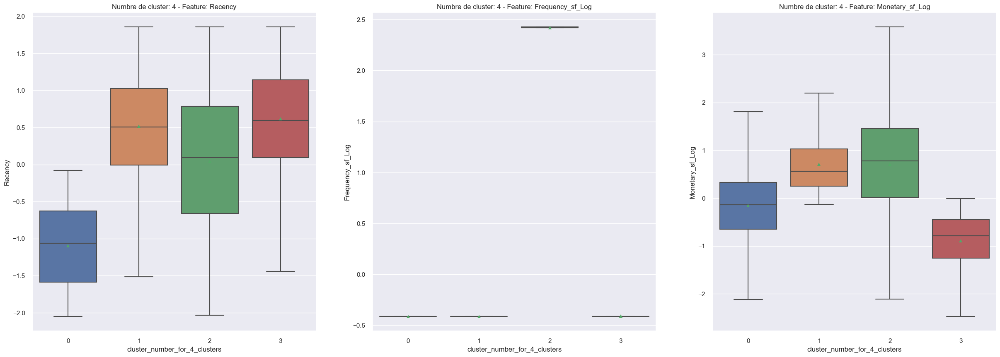

In [38]:
for i,j in enumerate(df_wk3_pca.iloc[:,3:4]):
    clusterNumber = int(re.sub('cluster_number_for_',
                               '',
                               re.sub('\_clusters$',
                                      '',
                                      j)))
    plt.figure(figsize=(30,10))
    for k in range(3):
        plt.subplot(1,3,k+1)
        plt.title(f'Numbre de cluster: {clusterNumber} - Feature: {df_wk3_pca.columns[k]}')
        sns.boxplot(x=df_wk3_pca.iloc[:,i+3],
                    y=df_wk3_pca.iloc[:,k],
                    showfliers = False,
                    showmeans=True)
    plt.show()

Nous constatons, sans grande surprise, que les modèles avec le plus de clusters permettent d'obtenir les classifications les plus détaillées. En revanche la pertinence de ce niveau de détail est très fortement mis en cause par la fréquence d'achat. Nous savons que notre echantillon ne comprend que 3% d'acheteurs renouvelant leurs achats. Le score RFM peut-être utile, mais avec un echantillon complet. 
Pour la continuation de notre étude, nous laisserons la fréquence de coté, et nous ajouterons d'autres features. 

## Test avec 4 features

La feature frequency ne sera plus utilisée dans notre étude car nous savons que seulement 3% des acheteurs de ce fichier effectuent plusieurs achats. Nous utiliserons des features d'analyse financière telles que le payement_value qui représente la somme totale payée par le client (prix de vente x X articles + frais de port éventuels) et la feature price qui est le prix des articles. 

In [39]:
df_wk4 = df_rfm_scaled[['Recency', 'Monetary_sf_Log', 'payment_value', 'price']]

In [40]:
df_wk4

,Recency,Monetary_sf_Log,payment_value,price
0,0.93272,-1.15197,-0.94090,-1.22718
1,0.70003,0.60060,0.71349,0.94496
2,-0.34556,0.42320,0.52689,0.78409
3,-0.46362,-1.42102,-1.16048,-1.13731
4,-0.07074,1.37629,1.58592,1.00546
...,...,...,...,...
64062,-1.84667,-0.68767,-0.54162,-0.57321
64063,0.80613,-0.39224,-0.27355,-0.15137
64064,0.46444,-0.51583,-0.38706,-0.28051
64065,1.80104,2.84292,3.51664,2.21559



### Segmentation

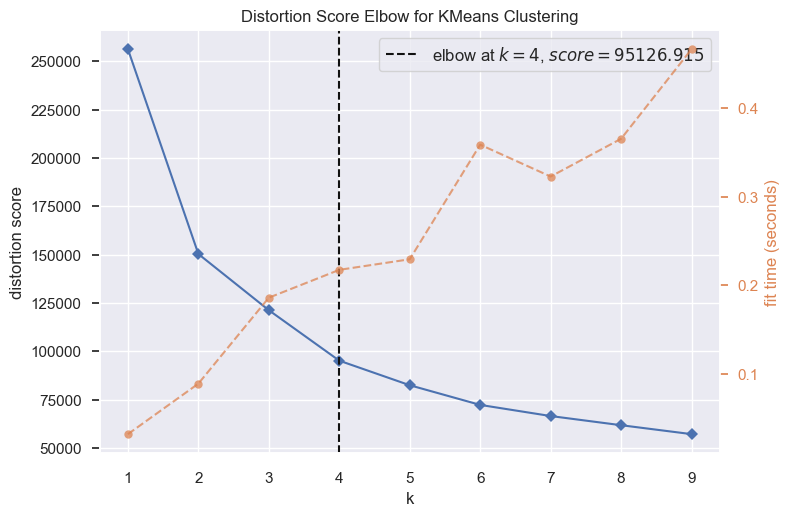

Silhouette score pour k(clusters) = 2 est 0.3512226266455895
Silhouette score pour k(clusters) = 3 est 0.2603485656895291
Silhouette score pour k(clusters) = 4 est 0.3005187638263395
Silhouette score pour k(clusters) = 5 est 0.28906670994617956
Silhouette score pour k(clusters) = 6 est 0.30046073823327635
Silhouette score pour k(clusters) = 7 est 0.2785966399989318
Silhouette score pour k(clusters) = 8 est 0.26636360510822543
Silhouette score pour k(clusters) = 9 est 0.2696715035401935


,Clusters,Sil Score
0,2,0.35122
1,3,0.26035
2,4,0.30052
3,5,0.28907
4,6,0.30046
5,7,0.27860
6,8,0.26636
7,9,0.26967


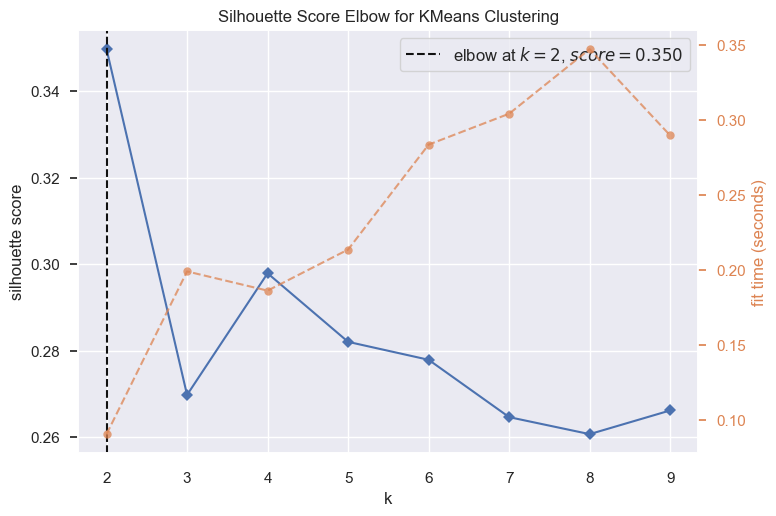

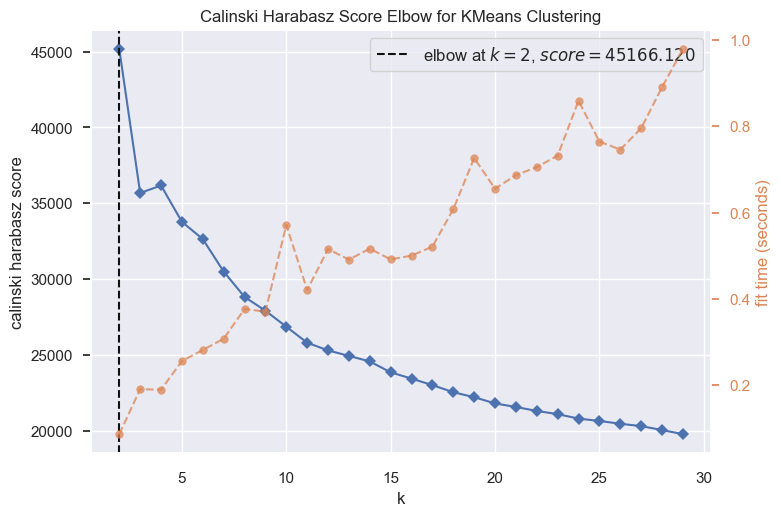

Score Davies Bouldin pour 2 clusters : 1.067
Score Davies Bouldin pour 3 clusters : 1.219
Score Davies Bouldin pour 4 clusters : 1.000
Score Davies Bouldin pour 5 clusters : 1.097
Score Davies Bouldin pour 6 clusters : 1.023
Score Davies Bouldin pour 7 clusters : 1.039
Score Davies Bouldin pour 8 clusters : 1.086
Score Davies Bouldin pour 9 clusters : 1.036
Score Davies Bouldin pour 10 clusters : 1.057


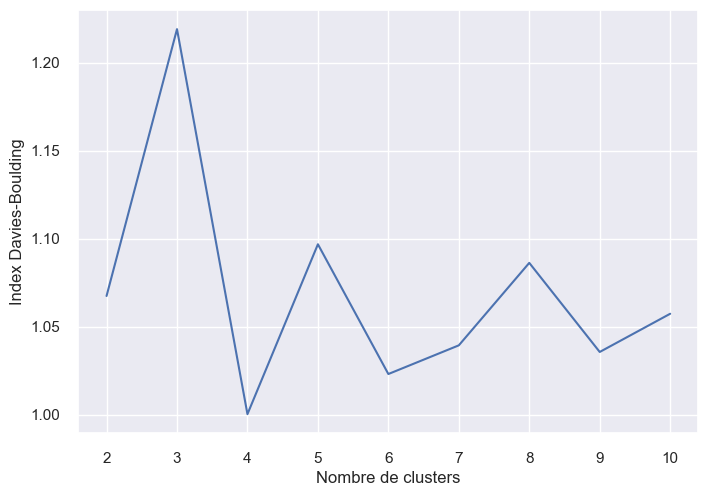

In [41]:
scores(df_wk4)

In [42]:
df_wk4_pca = df_rfm_scaled[['Recency', 'Monetary_sf_Log', 'payment_value', 'price']]
for i in[5,7,8]:
    print('n_clusters =',i)
    df_wk4_pca['cluster_number_for_'+str(i)+'_clusters'] = \
        pd.DataFrame(data=KMeans(n_clusters=i).fit(df_wk4_pca).labels_,
                     index=df_wk4.index)

n_clusters = 5
n_clusters = 7
n_clusters = 8


In [43]:
df_wk4_pca

,Recency,Monetary_sf_Log,payment_value,price,cluster_number_for_5_clusters,cluster_number_for_7_clusters,cluster_number_for_8_clusters
0,0.93272,-1.15197,-0.94090,-1.22718,4,6,2
1,0.70003,0.60060,0.71349,0.94496,1,5,5
2,-0.34556,0.42320,0.52689,0.78409,0,2,6
3,-0.46362,-1.42102,-1.16048,-1.13731,3,3,4
4,-0.07074,1.37629,1.58592,1.00546,2,1,7
...,...,...,...,...,...,...,...
64062,-1.84667,-0.68767,-0.54162,-0.57321,0,4,1
64063,0.80613,-0.39224,-0.27355,-0.15137,4,6,2
64064,0.46444,-0.51583,-0.38706,-0.28051,4,6,2
64065,1.80104,2.84292,3.51664,2.21559,2,1,3


 #### ACP à 2 dimensions

In [44]:
X = numerical_features
X_scaled = df_wk4_pca
all_features = X.columns

In [45]:
twod_pca = PCA(n_components=2)
X_pca = twod_pca.fit_transform(X_scaled)

In [46]:
df_wk4_pca['pca1'] = X_pca[:,0]
df_wk4_pca['pca2'] = X_pca[:,1]

In [47]:
df_wk4_pca['member'] = 1
df_wk4_pca.groupby('cluster_number_for_5_clusters')['member'].transform('count').div(df_wk4.shape[0])

0        0.21709
1        0.24954
2        0.25291
3        0.15378
4        0.12670
          ...   
64062    0.25291
64063    0.21709
64064    0.21709
64065    0.12670
64066    0.21709
Name: member, Length: 64067, dtype: float64

In [48]:
selection = alt.selection_multi(fields=['cluster_number_for_5_clusters'], bind='legend')

df_wk4_pca['cluster_number_for_5_clusters_weight'] = df_wk4_pca['cluster_number_for_5_clusters'].map(df_wk4_pca['cluster_number_for_5_clusters'].value_counts(normalize=True).to_dict())
# Echantillon stratifié de 20%
alt.Chart(df_wk4_pca.sample(5000, weights='cluster_number_for_5_clusters_weight')).mark_circle(size=60).encode(
    x=alt.X('pca1', title='First component'),
    y=alt.Y('pca2', title='Second component'),
    color=alt.Color('cluster_number_for_5_clusters:N'),
    tooltip=['cluster_number_for_5_clusters'],
    opacity=alt.condition(selection, alt.value(1), alt.value(0.2))
).properties(
    title='PCA analyse',
    width=600,
    height=400
).add_selection(
    selection
)

alt.Chart(...)

#### K-MEANS

Pour n_clusters = 5 Le score Silhouette moyen est : 0.5662344175321901
Pour n_clusters = 7 Le score Silhouette moyen est : 0.3685767770971513
Pour n_clusters = 8 Le score Silhouette moyen est : 0.37937552776801853


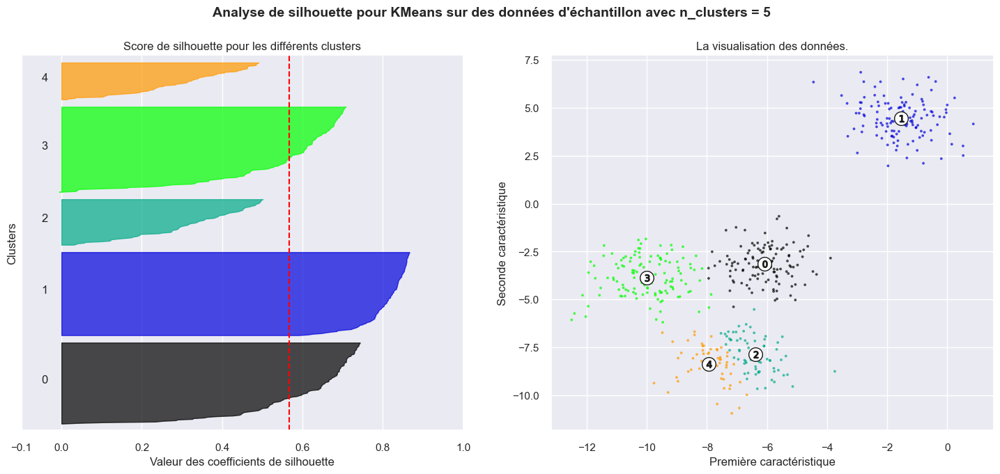

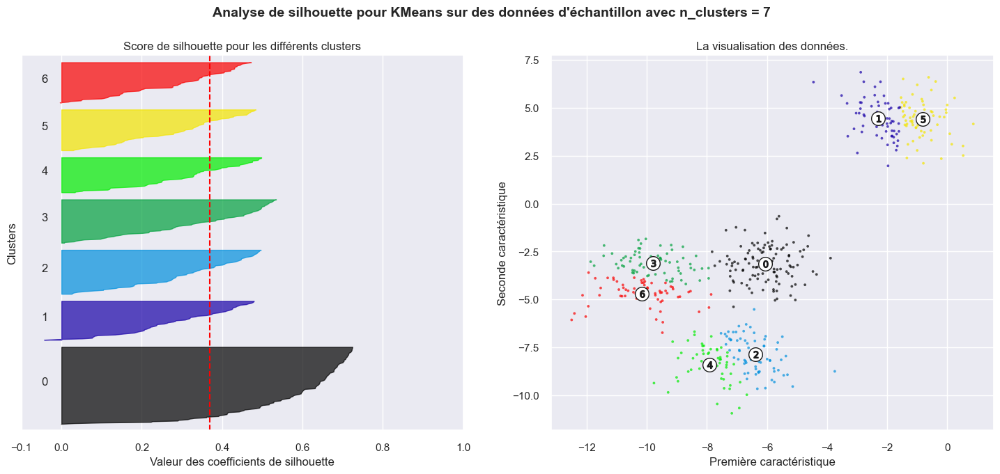

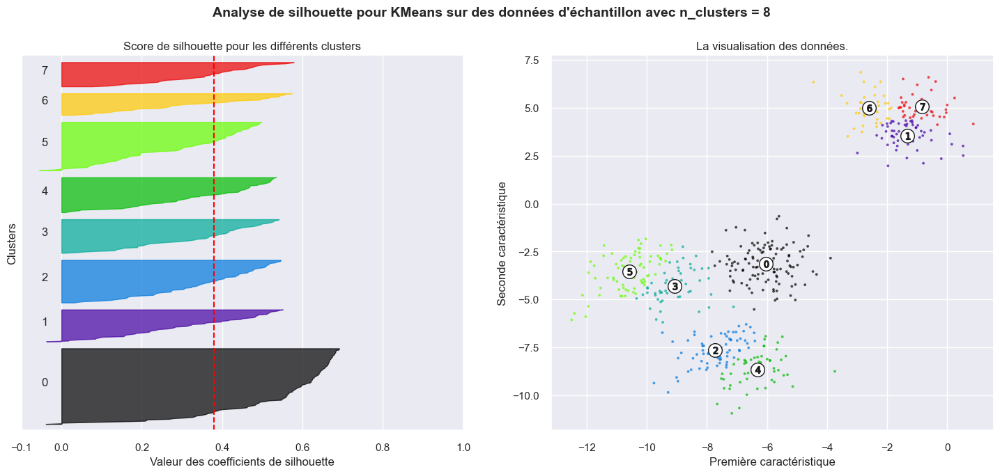

In [49]:
silhouettes(df_wk4, [5,7,8])

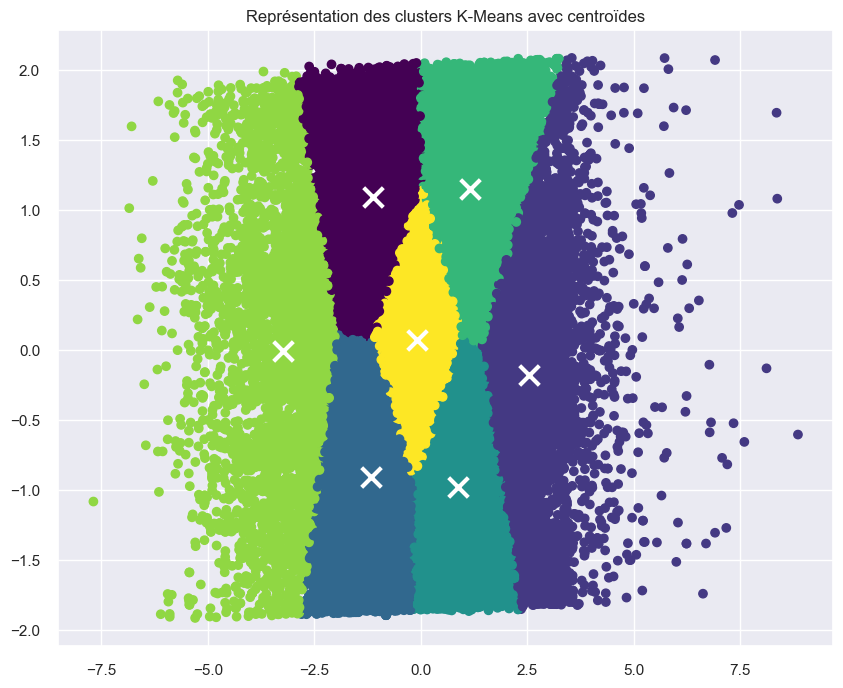

In [50]:
# Charger les données et normaliser les variables
df = df_wk4
df_norm = (df - df.mean()) / df.std()

# Appliquer PCA pour réduire la dimensionnalité des données à 2
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_norm)
df_pca = pd.DataFrame(df_pca, columns=['PC1', 'PC2'])

# Appliquer K-Means pour obtenir les segments/clusters
kmeans = KMeans(n_clusters=7, init='k-means++', random_state=42)
kmeans.fit(df_pca)
df_pca['Segment_K_means'] = kmeans.labels_
df_segm_analysis = df_pca.groupby(['Segment_K_means']).mean()

# Afficher la représentation graphique avec les centroïdes
fig, ax = plt.subplots(figsize=(10,8))
scatter = ax.scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['Segment_K_means'], cmap='viridis')
centroids = kmeans.cluster_centers_
ax.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=200, linewidths=3, color='white')
plt.title("Représentation des clusters K-Means avec centroïdes")
plt.show()

#### Interpretation des clusters

In [51]:
df_wk4_pca

,Recency,Monetary_sf_Log,payment_value,price,cluster_number_for_5_clusters,cluster_number_for_7_clusters,cluster_number_for_8_clusters,pca1,pca2,member,cluster_number_for_5_clusters_weight
0,0.93272,-1.15197,-0.94090,-1.22718,4,6,2,3.71375,-1.54278,1,0.21709
1,0.70003,0.60060,0.71349,0.94496,1,5,5,-1.45966,-2.04773,1,0.24954
2,-0.34556,0.42320,0.52689,0.78409,0,2,6,-3.40019,0.68004,1,0.25291
3,-0.46362,-1.42102,-1.16048,-1.13731,3,3,4,0.97940,0.96006,1,0.15378
4,-0.07074,1.37629,1.58592,1.00546,2,1,7,-4.31919,1.07313,1,0.12670
...,...,...,...,...,...,...,...,...,...,...,...
64062,-1.84667,-0.68767,-0.54162,-0.57321,0,4,1,1.64347,0.94082,1,0.25291
64063,0.80613,-0.39224,-0.27355,-0.15137,4,6,2,2.97655,-1.77341,1,0.21709
64064,0.46444,-0.51583,-0.38706,-0.28051,4,6,2,3.04360,-1.66399,1,0.21709
64065,1.80104,2.84292,3.51664,2.21559,2,1,3,-2.56736,1.35729,1,0.12670


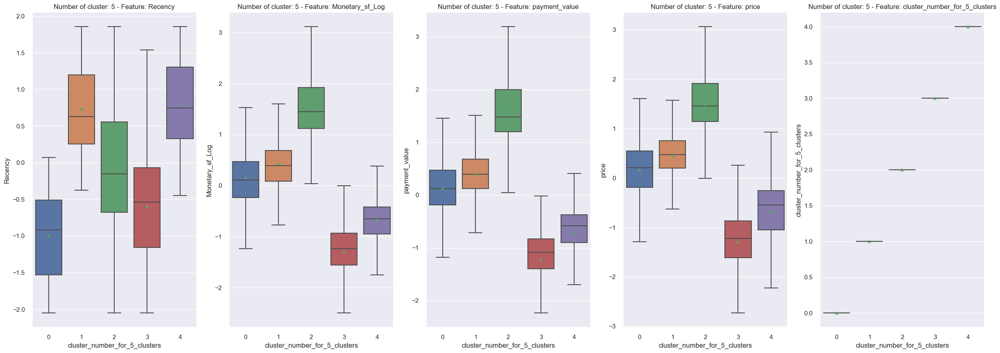

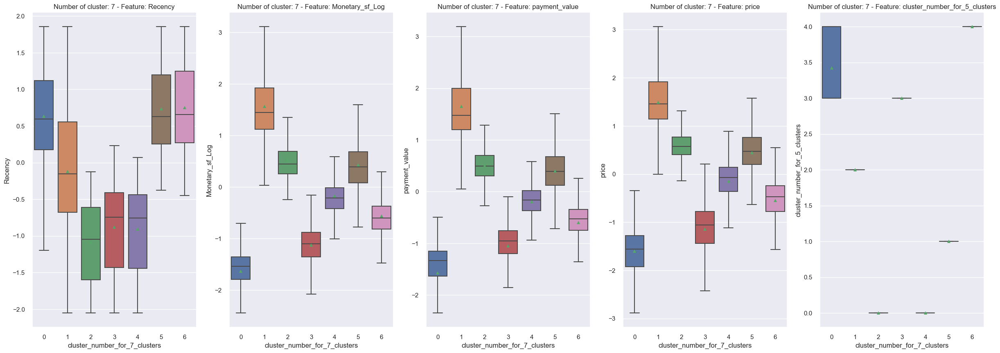

In [52]:
for i,j in enumerate(df_wk4_pca.iloc[:,4:6]):
    clusterNumber = int(re.sub('cluster_number_for_',
                               '',
                               re.sub('\_clusters$',
                                      '',
                                      j)))
    plt.figure(figsize=(30,10))
    for k in range(5):
        plt.subplot(1,5,k+1)
        plt.title(f'Number of cluster: {clusterNumber} - Feature: {df_wk4_pca.columns[k]}')
        sns.boxplot(x=df_wk4_pca.iloc[:,i+4],
                    y=df_wk4_pca.iloc[:,k],
                    showfliers = False,
                    showmeans=True)
    plt.show()

Le modèle s'affine, toutefois, la features Recency et Monetary restent peux pertinente et doivent être compétées par des données permettant une meilleure discrimination. 

## Dataframe final

Nous utiliserons des features catégorielles afin d'obtenir un meilleur niveau de segementation. 

### Features numériques et catégorielles

#### Préparation des features catégorielles

In [53]:
display(categorical_features)

,customer_unique_id,customer_zip_code_prefix,city,customer_state,order_purchase_timestamp,payment_type,payment_installments,review_score,product_category_name,order_purchase_hour,order_purchase_time_day,order_purchase_dayofweek,nb_articles
0,0000f6ccb0745a6a4b88665a16c9f078,66812,belem,PA,2017-10-12,credit_card,4.0,4.0,electronics,20,Soiree,Thu,1
1,0004aac84e0df4da2b147fca70cf8255,18040,sorocaba,SP,2017-11-14,credit_card,6.0,5.0,electronics,19,Soiree,Tue,1
2,0004bd2a26a76fe21f786e4fbd80607f,5036,sao paulo,SP,2018-04-05,credit_card,8.0,4.0,tools,19,Soiree,Thu,1
3,00050ab1314c0e55a6ca13cf7181fecf,13084,campinas,SP,2018-04-20,boleto,1.0,4.0,electronics,12,Nuit,Fri,1
4,00053a61a98854899e70ed204dd4bafe,80410,curitiba,PR,2018-02-28,credit_card,3.0,1.0,auto_leisure,11,Nuit,Wed,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
64062,fff96bc586f78b1f070da28c4977e810,13309,itu,SP,2018-08-15,credit_card,2.0,4.0,housewares,10,Nuit,Wed,1
64063,fffa431dd3fcdefea4b1777d114144f2,28660,bom jardim,RJ,2017-10-30,boleto,1.0,5.0,other,20,Soiree,Mon,1
64064,fffb09418989a0dbff854a28163e47c6,95330,veranopolis,RS,2017-12-17,boleto,1.0,5.0,fashion,19,Soiree,Sun,1
64065,fffcf5a5ff07b0908bd4e2dbc735a684,55250,sanharo,PE,2017-06-08,credit_card,10.0,5.0,hygiene_and_beauty,21,Soiree,Thu,2


In [54]:
df_categories = categorical_features[['payment_type', 'review_score', 'order_purchase_time_day', 'order_purchase_dayofweek', 'product_category_name', 'payment_installments', 'nb_articles']]

#### Encodage des features

One Hot encoder :
Les algorithmes de machine learning ne fonctionnent pas avec les features catégoriques. Elles doivent être transformées en nombres.
Un one hot encoder est une représentation des valeurs catégoriques en vecteurs binaires. Cela requiert en premier lieu le mappage des données en valeurs entières. Cet entier est un vecteur binaires dans lequel toutes les valeurs sont à 0 à l'exception de la valeur index de ce vecteur qui elle est représenté par un 1.

Nous utiliserons le one hot encoder de scikit learn.

In [55]:
df_categories

,payment_type,review_score,order_purchase_time_day,order_purchase_dayofweek,product_category_name,payment_installments,nb_articles
0,credit_card,4.0,Soiree,Thu,electronics,4.0,1
1,credit_card,5.0,Soiree,Tue,electronics,6.0,1
2,credit_card,4.0,Soiree,Thu,tools,8.0,1
3,boleto,4.0,Nuit,Fri,electronics,1.0,1
4,credit_card,1.0,Nuit,Wed,auto_leisure,3.0,2
...,...,...,...,...,...,...,...
64062,credit_card,4.0,Nuit,Wed,housewares,2.0,1
64063,boleto,5.0,Soiree,Mon,other,1.0,1
64064,boleto,5.0,Soiree,Sun,fashion,1.0,1
64065,credit_card,5.0,Soiree,Thu,hygiene_and_beauty,10.0,2


In [56]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
X_encoded = encoder.fit_transform(df_categories)

# création du nom des features catégoriques
categorical_columns = [f'{col}_{cat}' for i, col in enumerate(df_categories.columns)
                       for cat in encoder.categories_[i]]

#Nous créons un dataframe avec les variables catégoriques auquel nous joignons les features numériques

one_hot_features = pd.DataFrame(X_encoded,
                                columns=categorical_columns)

one_hot_features.T


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,...,64032,64033,64034,64035,64036,64037,64038,64039,64040,64041,64042,64043,64044,64045,64046,64047,64048,64049,64050,64051,64052,64053,64054,64055,64056,64057,64058,64059,64060,64061,64062,64063,64064,64065,64066
payment_type_boleto,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
payment_type_credit_card,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0
payment_type_debit_card,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
payment_type_voucher,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
review_score_1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
review_score_2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
review_score_3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
review_score_4.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0
review_score_5.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0
order_purchase_time_day_Apres Midi,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


### Filtrage Low Variance

In [57]:
df_wk5 = df_wk4.join(one_hot_features)

In [58]:
display(df_wk5.T)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,...,64032,64033,64034,64035,64036,64037,64038,64039,64040,64041,64042,64043,64044,64045,64046,64047,64048,64049,64050,64051,64052,64053,64054,64055,64056,64057,64058,64059,64060,64061,64062,64063,64064,64065,64066
Recency,0.93272,0.70003,-0.34556,-0.46362,-0.07074,-0.16128,-0.25282,-0.48758,1.36348,0.31273,1.32211,-1.12864,-1.12864,-1.93423,-0.71170,-1.55871,-1.55871,1.57623,-0.10835,1.66498,1.40478,0.89763,0.23261,-1.65875,-1.58721,1.32211,-1.97819,-1.97819,-1.58721,-0.02581,0.05605,1.65817,-1.34756,-0.72048,-1.08856,...,-0.61805,0.62897,0.23992,-0.95811,-1.58721,1.13515,-1.75962,1.48720,-0.12344,0.18871,-0.50362,1.76708,1.37037,1.42541,-1.61577,0.60760,0.05605,-1.15556,-0.34556,-1.67312,-0.50362,-0.65160,1.03764,1.23226,-0.04077,-1.14208,-0.46362,-1.47368,0.39239,0.39239,-1.84667,0.80613,0.46444,1.80104,0.51469
Monetary_sf_Log,-1.15197,0.60060,0.42320,-1.42102,1.37629,0.14544,-0.68309,-0.37998,-0.25530,-1.37416,0.88275,-0.43336,-0.43336,-1.74189,-2.13848,1.90338,1.90338,1.12458,-0.71911,0.57834,0.03820,0.34658,-0.15189,-0.48911,0.07698,-0.25620,1.13598,1.13598,-1.34280,-1.77868,-0.30178,-1.37240,0.38830,-1.92522,-0.68940,...,0.42281,-2.05131,0.55924,-1.46794,-0.97075,2.11045,0.35394,0.77090,-0.33341,0.75086,-0.63832,-0.54911,0.24949,-0.02620,0.83216,0.34714,0.72255,-0.23226,0.19547,-0.79704,-0.52237,0.41483,-0.69689,-0.97795,0.46147,-0.28226,0.62209,-0.37340,1.60836,1.60836,-0.68767,-0.39224,-0.51583,2.84292,-0.34430
payment_value,-0.94090,0.71349,0.52689,-1.16048,1.58592,0.24389,-0.53755,-0.26218,-0.14546,-1.12284,1.01996,-2.55997,-0.43665,-1.41155,-1.70629,1.41571,1.41571,1.29241,-0.56949,0.68982,0.13754,0.44773,-0.04707,-0.36269,0.17581,-0.14631,0.51214,0.51214,-1.09751,-1.43961,-0.18922,-1.12142,0.49073,-1.54990,-0.54315,...,-0.24357,-1.64294,0.66957,-1.19792,-0.78818,2.50317,0.45529,0.89702,-0.21882,0.87520,-0.49762,-0.41729,0.34862,0.07444,0.96412,0.44830,0.84447,-0.12366,0.29405,-0.63805,-0.39301,0.51821,-0.54981,-0.79432,0.56676,-0.17088,0.73641,-0.25608,1.05671,1.05671,-0.54162,-0.27355,-0.38706,3.51664,-0.22899
price,-1.22718,0.94496,0.78409,-1.13731,1.00546,0.37736,-0.45208,-0.15311,0.03847,-1.09867,0.68381,-0.24380,-0.24380,-1.90927,-2.09712,0.52043,-1.37470,1.45092,-0.45208,0.91216,0.32550,0.60570,0.18613,-1.05768,0.00187,-1.61813,0.42751,-1.18136,-1.41308,-2.09517,0.07964,-1.28030,0.76981,-2.54942,-0.71415,...,-1.22671,-2.86650,0.88024,-1.83309,-1.75704,2.44908,0.60236,1.07714,-0.06781,1.11995,-0.47429,-0.45092,-1.05768,0.21065,1.10139,0.68456,1.04710,0.04581,0.52158,-0.71415,-0.24380,0.85554,-0.34124,-0.86956,0.64555,-1.43081,0.60603,-0.34437,0.54699,0.54699,-0.57321,-0.15137,-0.28051,2.21559,-0.15311
payment_type_boleto,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,1.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000
payment_type_credit_card,1.00000,1.00000,1.00000,0.00000,1.00000,1.00000,1.00000,0.00000,1.00000,1.00000,1.00000,1.00000,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,1.00000,1.00000,1.00000,0.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,...,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,0.00000,1.00000,1.00000,0.00000,1.00000,0.00000,0.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,0.00000,1.00000,1.00000,1.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,1.00000
payment_type_debit_card,0.00000,0.00000,0.00000,0.00000,0.00000,0

In [59]:
df_wk5.nunique(axis=0)

Recency                                              456
Monetary_sf_Log                                    21970
payment_value                                      22315
price                                               4661
payment_type_boleto                                    2
payment_type_credit_card                               2
payment_type_debit_card                                2
payment_type_voucher                                   2
review_score_1.0                                       2
review_score_2.0                                       2
review_score_3.0                                       2
review_score_4.0                                       2
review_score_5.0                                       2
order_purchase_time_day_Apres Midi                     2
order_purchase_time_day_Midi                           2
order_purchase_time_day_Nuit                           2
order_purchase_time_day_Soiree                         2
order_purchase_dayofweek_Fri   

In [60]:
df_wk5.isnull().sum()/len(df_wk5)*100

Recency                                            0.0
Monetary_sf_Log                                    0.0
payment_value                                      0.0
price                                              0.0
payment_type_boleto                                0.0
payment_type_credit_card                           0.0
payment_type_debit_card                            0.0
payment_type_voucher                               0.0
review_score_1.0                                   0.0
review_score_2.0                                   0.0
review_score_3.0                                   0.0
review_score_4.0                                   0.0
review_score_5.0                                   0.0
order_purchase_time_day_Apres Midi                 0.0
order_purchase_time_day_Midi                       0.0
order_purchase_time_day_Nuit                       0.0
order_purchase_time_day_Soiree                     0.0
order_purchase_dayofweek_Fri                       0.0
order_purc

In [61]:
df_wk5.dtypes

Recency                                            float64
Monetary_sf_Log                                    float64
payment_value                                      float64
price                                              float64
payment_type_boleto                                float64
payment_type_credit_card                           float64
payment_type_debit_card                            float64
payment_type_voucher                               float64
review_score_1.0                                   float64
review_score_2.0                                   float64
review_score_3.0                                   float64
review_score_4.0                                   float64
review_score_5.0                                   float64
order_purchase_time_day_Apres Midi                 float64
order_purchase_time_day_Midi                       float64
order_purchase_time_day_Nuit                       float64
order_purchase_time_day_Soiree                     float

In [62]:
#df_wk5 = pd.DataFrame(df_wk5)
normalize = normalize(df_wk5)

In [63]:
data_scaled = pd.DataFrame(normalize)
data_scaled.var()

0     8.94524e-02
1     6.98039e-02
2     6.61794e-02
3     7.24963e-02
4     1.55184e-02
5     2.02803e-02
6     1.46071e-03
7     4.38866e-03
8     9.62699e-03
9     3.10769e-03
10    7.64326e-03
11    1.58439e-02
12    2.49562e-02
13    1.89797e-02
14    1.14997e-02
15    2.37809e-02
16    1.85530e-02
17    1.24001e-02
18    1.36988e-02
19    9.85504e-03
20    1.07978e-02
21    1.26851e-02
22    1.33841e-02
23    1.31998e-02
24    1.71388e-03
25    2.36061e-05
26    1.35992e-02
27    2.19036e-04
28    9.05788e-05
29    2.10373e-03
30    1.48083e-02
31    1.18953e-02
32    2.35846e-05
33    1.09456e-02
34    7.62561e-06
35    1.16353e-03
36    1.94690e-03
37    1.90617e-03
38    8.22523e-03
39    1.07318e-02
40    3.35295e-03
41    2.11507e-04
42    2.89572e-04
43    5.22625e-03
44    1.95896e-06
45    2.53149e-02
46    1.13497e-02
47    9.38259e-03
48    6.56730e-03
49    5.03221e-03
50    3.72704e-03
51    1.56757e-03
52    3.78610e-03
53    6.31554e-04
54    4.28524e-03
55    2.56

In [64]:
variance = data_scaled.var()
columns = df_wk5.columns

In [65]:
variable = [ ]

for i in range(0,len(variance)):
    if variance[i]>=0.007: # Définition du seuil
        variable.append(columns[i])

In [66]:
variable

['Recency',
 'Monetary_sf_Log',
 'payment_value',
 'price',
 'payment_type_boleto',
 'payment_type_credit_card',
 'review_score_1.0',
 'review_score_3.0',
 'review_score_4.0',
 'review_score_5.0',
 'order_purchase_time_day_Apres Midi',
 'order_purchase_time_day_Midi',
 'order_purchase_time_day_Nuit',
 'order_purchase_time_day_Soiree',
 'order_purchase_dayofweek_Fri',
 'order_purchase_dayofweek_Mon',
 'order_purchase_dayofweek_Sat',
 'order_purchase_dayofweek_Sun',
 'order_purchase_dayofweek_Thu',
 'order_purchase_dayofweek_Tue',
 'order_purchase_dayofweek_Wed',
 'product_category_name_auto_leisure',
 'product_category_name_decoration',
 'product_category_name_electronics',
 'product_category_name_fashion',
 'product_category_name_housewares',
 'product_category_name_hygiene_and_beauty',
 'payment_installments_1.0',
 'payment_installments_2.0',
 'payment_installments_3.0',
 'nb_articles_1',
 'nb_articles_2']

In [67]:
# creation d'un dataframe
df_wk5_lf = df_wk5[variable]

df_wk5_lf.head()

,Recency,Monetary_sf_Log,payment_value,price,payment_type_boleto,payment_type_credit_card,review_score_1.0,review_score_3.0,review_score_4.0,review_score_5.0,order_purchase_time_day_Apres Midi,order_purchase_time_day_Midi,order_purchase_time_day_Nuit,order_purchase_time_day_Soiree,order_purchase_dayofweek_Fri,order_purchase_dayofweek_Mon,order_purchase_dayofweek_Sat,order_purchase_dayofweek_Sun,order_purchase_dayofweek_Thu,order_purchase_dayofweek_Tue,order_purchase_dayofweek_Wed,product_category_name_auto_leisure,product_category_name_decoration,product_category_name_electronics,product_category_name_fashion,product_category_name_housewares,product_category_name_hygiene_and_beauty,payment_installments_1.0,payment_installments_2.0,payment_installments_3.0,nb_articles_1,nb_articles_2
0,0.93272,-1.15197,-0.94090,-1.22718,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.70003,0.60060,0.71349,0.94496,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,-0.34556,0.42320,0.52689,0.78409,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,-0.46362,-1.42102,-1.16048,-1.13731,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,-0.07074,1.37629,1.58592,1.00546,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [68]:
#variance des variables 
df_wk5_lf.var()

Recency                                     1.00002
Monetary_sf_Log                             1.00002
payment_value                               1.00002
price                                       1.00002
payment_type_boleto                         0.15222
payment_type_credit_card                    0.19025
review_score_1.0                            0.09614
review_score_3.0                            0.07556
review_score_4.0                            0.15583
review_score_5.0                            0.24289
order_purchase_time_day_Apres Midi          0.18786
order_purchase_time_day_Midi                0.11445
order_purchase_time_day_Nuit                0.23411
order_purchase_time_day_Soiree              0.18422
order_purchase_dayofweek_Fri                0.12376
order_purchase_dayofweek_Mon                0.13588
order_purchase_dayofweek_Sat                0.09812
order_purchase_dayofweek_Sun                0.10699
order_purchase_dayofweek_Thu                0.12560
order_purcha

In [69]:
# shape des data
df_wk5_lf.shape, df_wk5.shape

((64067, 32), (64067, 90))

### Reduction dimensionnelle par ACP 

In [70]:
n_components = 8

PCA ratio variance [0.09656636 0.06988764 0.06022415 0.05085426 0.04670377 0.04160166
 0.03754831 0.03738437]


array([10., 17., 23., 28., 32., 37., 40., 44.])

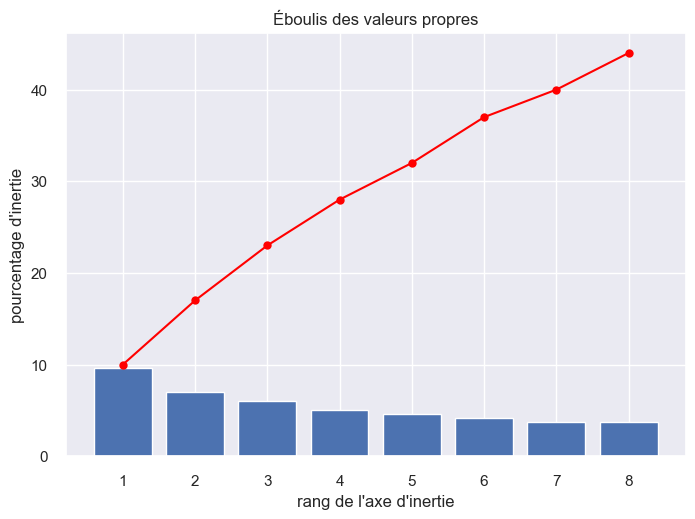

Calcul des composants                                                F1       F2       F3       F4  \
Recency                                   0.00599  0.01612  0.03251 -0.01881   
Monetary_sf_Log                          -0.45497  0.34043 -0.04553  0.03994   
payment_value                            -0.46301  0.27955 -0.17163 -0.01095   
price                                    -0.43931  0.24937 -0.24742 -0.01517   
payment_type_boleto                       0.26249  0.43380 -0.24154 -0.04682   
payment_type_credit_card                 -0.30976 -0.46031  0.14401  0.00342   
review_score_1.0                         -0.05469  0.11792  0.22937 -0.23418   
review_score_3.0                         -0.00265  0.02555  0.09984 -0.20665   
review_score_4.0                          0.00539  0.00244  0.05504 -0.52243   
review_score_5.0                          0.03518 -0.09917 -0.26208  0.69224   
order_purchase_time_day_Apres Midi       -0.00877  0.00582  0.01011  0.01595   
order_purchase_tim

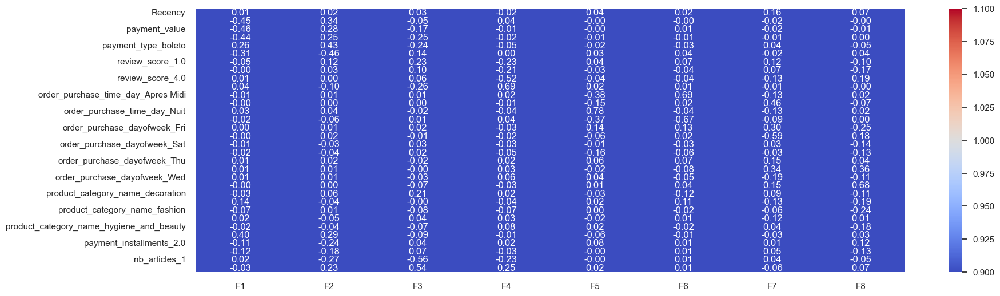

In [71]:
# Création de la variable contenant les colonnes
features = df_wk5_lf.columns

# Création de X la matrice de données
X = df_wk5_lf
keep_ind = X.index
X = np.nan_to_num(X)

# Scaling des données
scaler = StandardScaler()

# Fit et transformation des données
scaler.fit(X)
X_scaled = scaler.transform(X)

# Instanciation du PCA
pca = PCA(n_components=n_components)

# Entrainement du PCA sur les données scalées
pca.fit(X_scaled)

# Enregistrement des variances
scree = (pca.explained_variance_ratio_*100).round(2)

# Cumul des variances
scree_cum = scree.cumsum().round()

# Variable des composants
X_list = range(1, n_components+1)

print("PCA ratio variance", pca.explained_variance_ratio_)
display(scree_cum)

# Visualisation des éboulis et pourcentage d'inertie
plt.bar(X_list, scree)
plt.plot(X_list, scree_cum,c="red",marker='o')
plt.xlabel("rang de l'axe d'inertie")
plt.ylabel("pourcentage d'inertie")
plt.title("Éboulis des valeurs propres")
plt.show(block=False)

# Array de Calcul des composantes
pcs = pca.components_

# DF de calcul des composantes
pcs = pd.DataFrame(pcs)
# Calcul des composantes : arrondis
pcs.columns = features
pcs.index = [f"F{i}" for i in X_list]
pcs.round(2)

print("Calcul des composants", pcs.T)

# Representation visuelle des composantes
plt.subplots(figsize=(20,6))
sns.heatmap(pcs.T, vmin=1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

plt.show()

In [72]:
def correlation_graph(dataframe):
    corr = dataframe.corr()
    fig, ax = plt.subplots(figsize=(10, 8))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .5}, ax=ax, vmin=-1, vmax=1, fmt=".2f")


    plt.show()

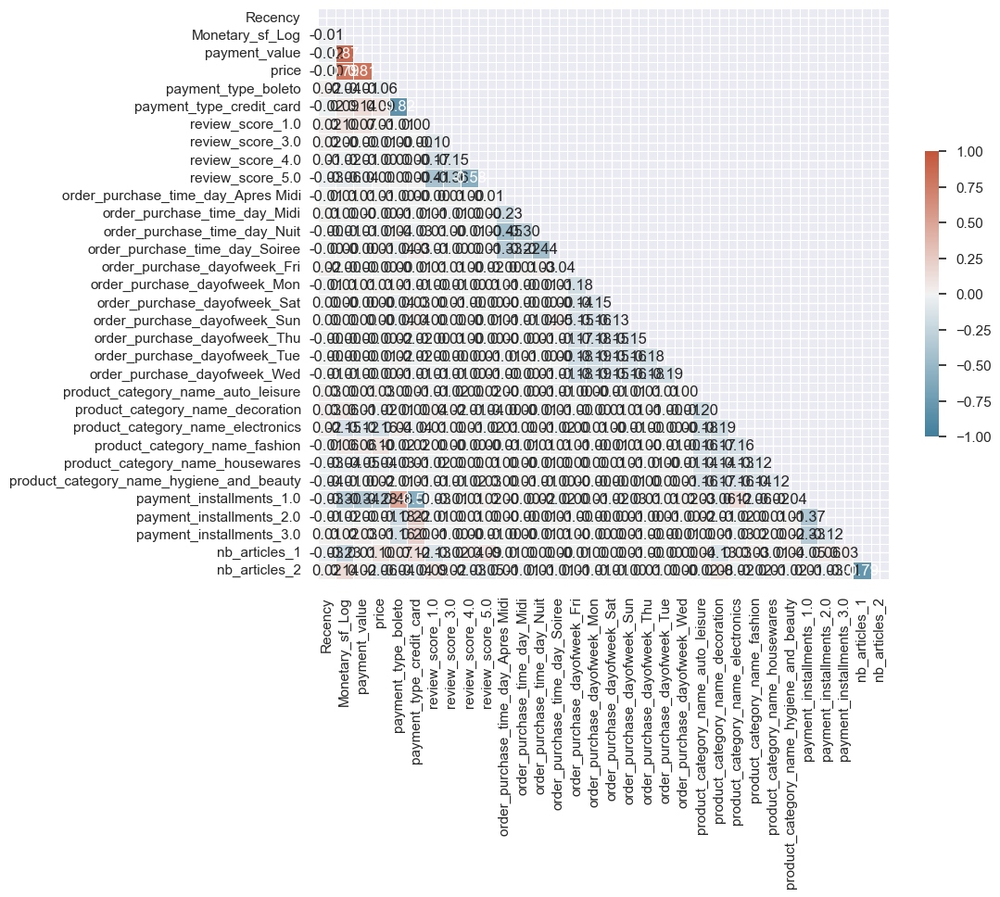

In [73]:
correlation_graph(df_wk5_lf)

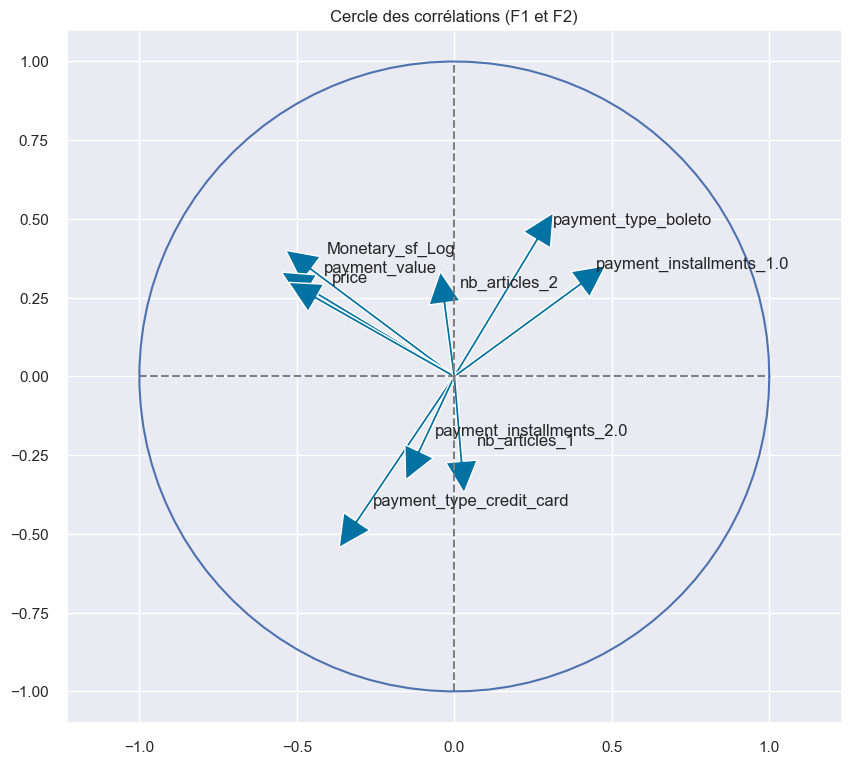

In [74]:
outils_analyses.correlation_graph(pca, (0,1), features)

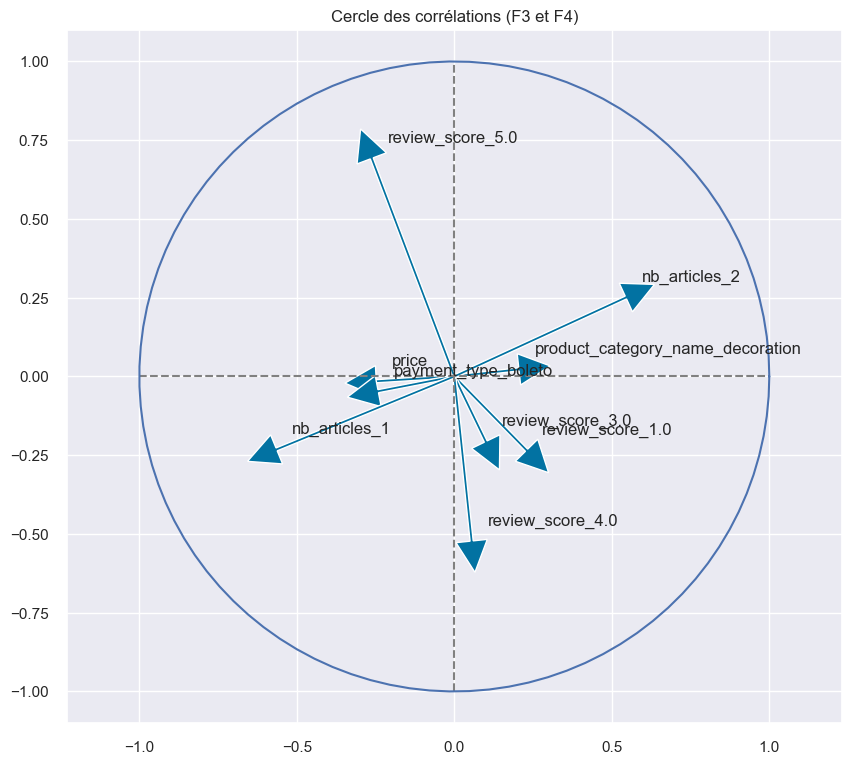

In [75]:
outils_analyses.correlation_graph(pca, (2,3), features)

In [76]:
df_wk5_lf.columns

Index(['Recency', 'Monetary_sf_Log', 'payment_value', 'price',
       'payment_type_boleto', 'payment_type_credit_card', 'review_score_1.0',
       'review_score_3.0', 'review_score_4.0', 'review_score_5.0',
       'order_purchase_time_day_Apres Midi', 'order_purchase_time_day_Midi',
       'order_purchase_time_day_Nuit', 'order_purchase_time_day_Soiree',
       'order_purchase_dayofweek_Fri', 'order_purchase_dayofweek_Mon',
       'order_purchase_dayofweek_Sat', 'order_purchase_dayofweek_Sun',
       'order_purchase_dayofweek_Thu', 'order_purchase_dayofweek_Tue',
       'order_purchase_dayofweek_Wed', 'product_category_name_auto_leisure',
       'product_category_name_decoration', 'product_category_name_electronics',
       'product_category_name_fashion', 'product_category_name_housewares',
       'product_category_name_hygiene_and_beauty', 'payment_installments_1.0',
       'payment_installments_2.0', 'payment_installments_3.0', 'nb_articles_1',
       'nb_articles_2'],
      dtype=

In [77]:
df_wk5_lf = df_wk5_lf[['price', 'payment_type_boleto', 'payment_type_credit_card', 'review_score_1.0', 'review_score_3.0', 'review_score_4.0', 'review_score_5.0',
                       'payment_installments_1.0', 'payment_installments_2.0', 'nb_articles_1', 'nb_articles_2']]

### Segmentation

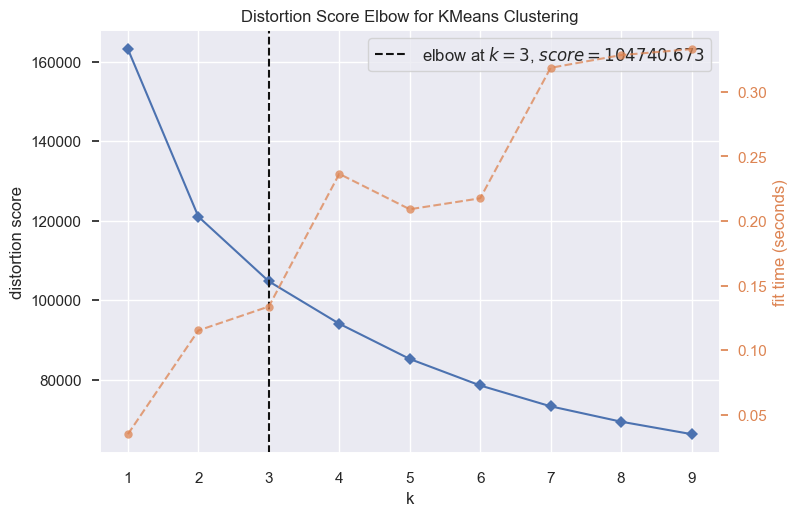

Silhouette score pour k(clusters) = 2 est 0.22312593257462662
Silhouette score pour k(clusters) = 3 est 0.2248418579215201
Silhouette score pour k(clusters) = 4 est 0.18479080783099766
Silhouette score pour k(clusters) = 5 est 0.19393378428195684
Silhouette score pour k(clusters) = 6 est 0.20572314949592488
Silhouette score pour k(clusters) = 7 est 0.2168298567670109
Silhouette score pour k(clusters) = 8 est 0.208961780692698
Silhouette score pour k(clusters) = 9 est 0.24340544007423795


,Clusters,Sil Score
0,2,0.22313
1,3,0.22484
2,4,0.18479
3,5,0.19393
4,6,0.20572
5,7,0.21683
6,8,0.20896
7,9,0.24341


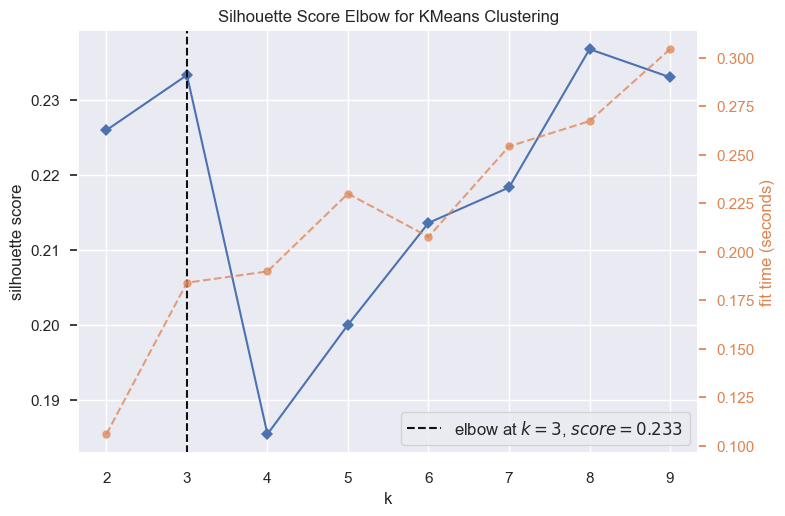

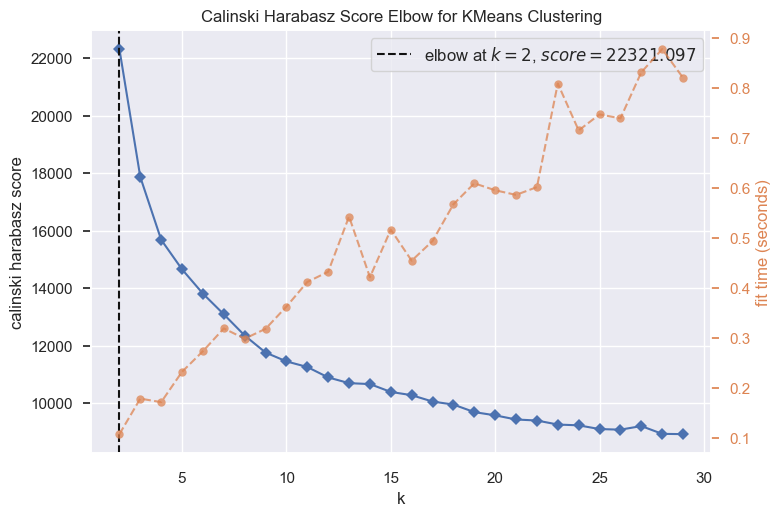

Score Davies Bouldin pour 2 clusters : 1.633
Score Davies Bouldin pour 3 clusters : 1.504
Score Davies Bouldin pour 4 clusters : 1.681
Score Davies Bouldin pour 5 clusters : 1.560
Score Davies Bouldin pour 6 clusters : 1.438
Score Davies Bouldin pour 7 clusters : 1.517
Score Davies Bouldin pour 8 clusters : 1.510
Score Davies Bouldin pour 9 clusters : 1.483
Score Davies Bouldin pour 10 clusters : 1.476


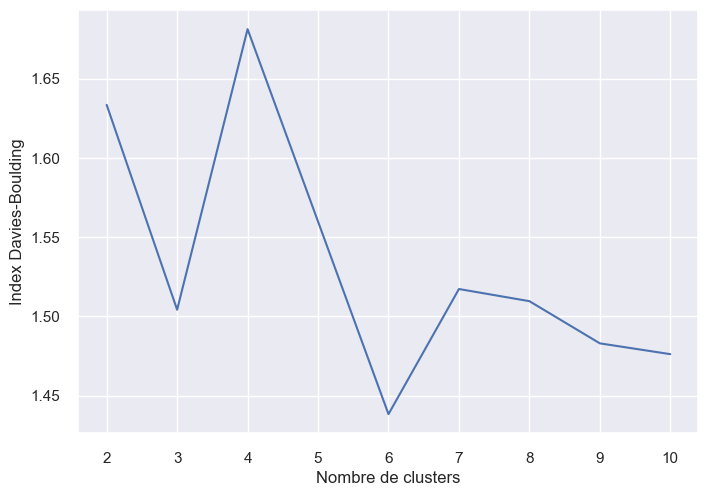

In [78]:
scores(df_wk5_lf)

In [79]:
for i in[4,7,8]:
    print('n_clusters =',i)
    df_wk5_lf['cluster_number_for_'+str(i)+'_clusters'] = \
        pd.DataFrame(data=KMeans(n_clusters=i).fit(df_wk5_lf).labels_,
                     index=df_wk5_lf.index)

n_clusters = 4
n_clusters = 7
n_clusters = 8




### HCA

In [80]:
df_wk5_sample = df_wk5_lf.sample(n=5000, random_state=42)

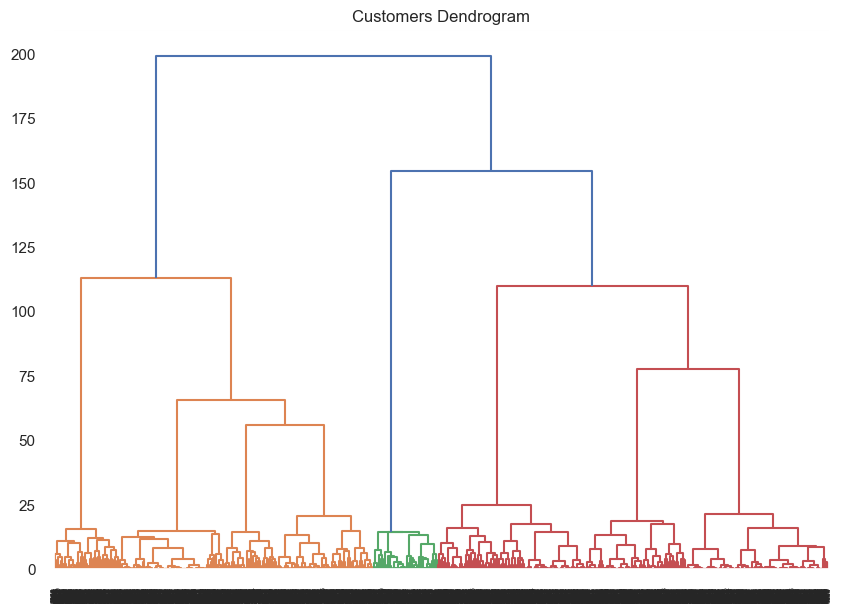

In [81]:
plt.figure(figsize=(10, 7))
plt.title("Customers Dendrogram")

# Selection du nombre de consommateur
selected_data = df_wk5_sample
clusters = sch.linkage(selected_data,
                       method='ward',
                       metric="euclidean")
sch.dendrogram(Z=clusters)
plt.show()

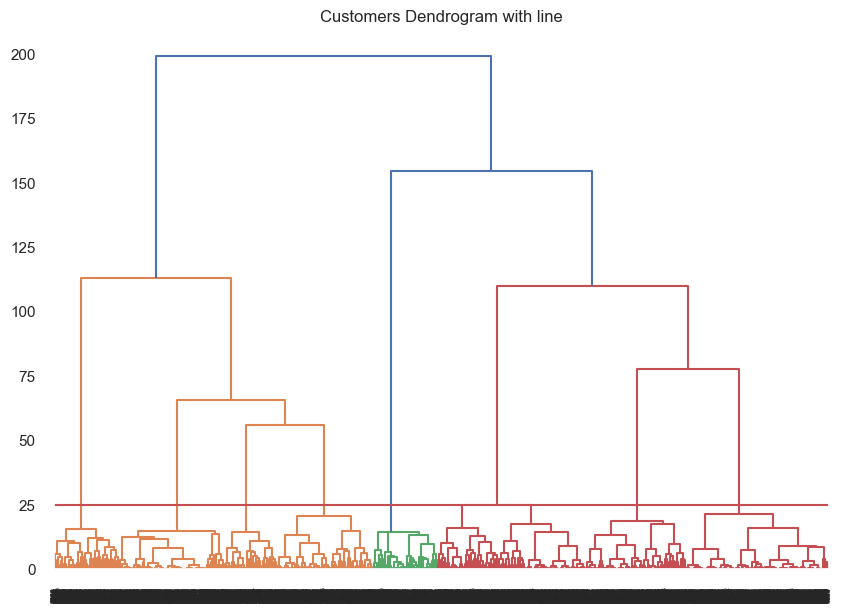

In [82]:
plt.figure(figsize=(10, 7))
plt.title("Customers Dendrogram with line")
clusters = sch.linkage(selected_data,
                       method='ward',
                       metric="euclidean")
sch.dendrogram(clusters)
plt.axhline(y = 25, color = 'r', linestyle = '-')

### ACP à 2 dimensions

In [83]:
X = numerical_features
X_scaled = df_wk5_lf
all_features = X.columns

In [84]:
twod_pca = PCA(n_components=2)
X_pca = twod_pca.fit_transform(X_scaled)

In [85]:
df_wk5_lf['pca1'] = X_pca[:,0]
df_wk5_lf['pca2'] = X_pca[:,1]

In [86]:
df_wk5_lf['member'] = 1
df_wk5_lf.groupby('cluster_number_for_8_clusters')['member'].transform('count').div(df_wk5_lf.shape[0])

0        0.08728
1        0.14120
2        0.08839
3        0.08728
4        0.08839
          ...   
64062    0.12389
64063    0.18701
64064    0.18701
64065    0.14120
64066    0.12389
Name: member, Length: 64067, dtype: float64

In [87]:
selection = alt.selection_multi(fields=['cluster_number_for_8_clusters'], bind='legend')

df_wk5_lf['cluster_number_for_8_clusters_weight'] = df_wk5_lf['cluster_number_for_8_clusters'].map(df_wk5_lf['cluster_number_for_8_clusters'].value_counts(normalize=True).to_dict())
# Echantillon stratifié de 20%
alt.Chart(df_wk5_lf.sample(5000, weights='cluster_number_for_8_clusters_weight')).mark_circle(size=60).encode(
    x=alt.X('pca1', title='First component'),
    y=alt.Y('pca2', title='Second component'),
    color=alt.Color('cluster_number_for_8_clusters:N'),
    tooltip=['cluster_number_for_8_clusters'],
    opacity=alt.condition(selection, alt.value(1), alt.value(0.2))
).properties(
    title='PCA analyse',
    width=600,
    height=400
).add_selection(
    selection
)

alt.Chart(...)

### K-MEANS

Pour n_clusters = 3 Le score Silhouette moyen est : 0.5882004012129721
Pour n_clusters = 7 Le score Silhouette moyen est : 0.3685767770971513
Pour n_clusters = 8 Le score Silhouette moyen est : 0.37937552776801853


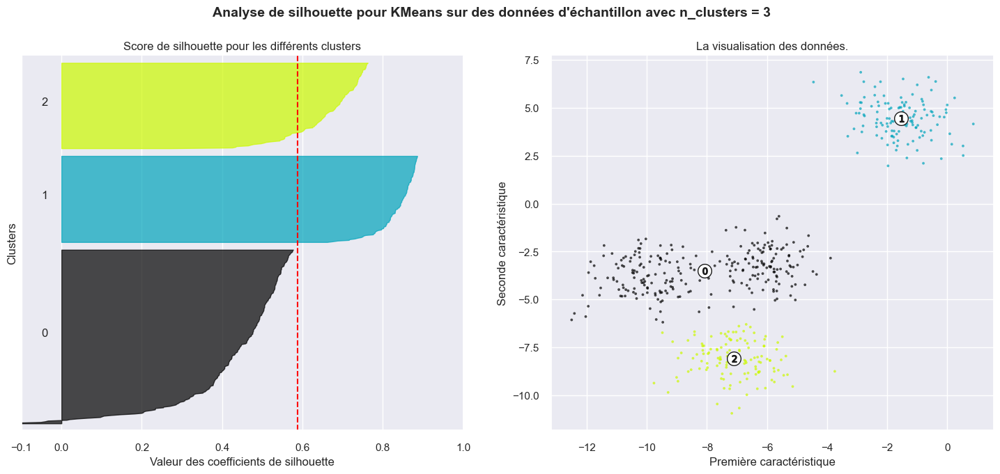

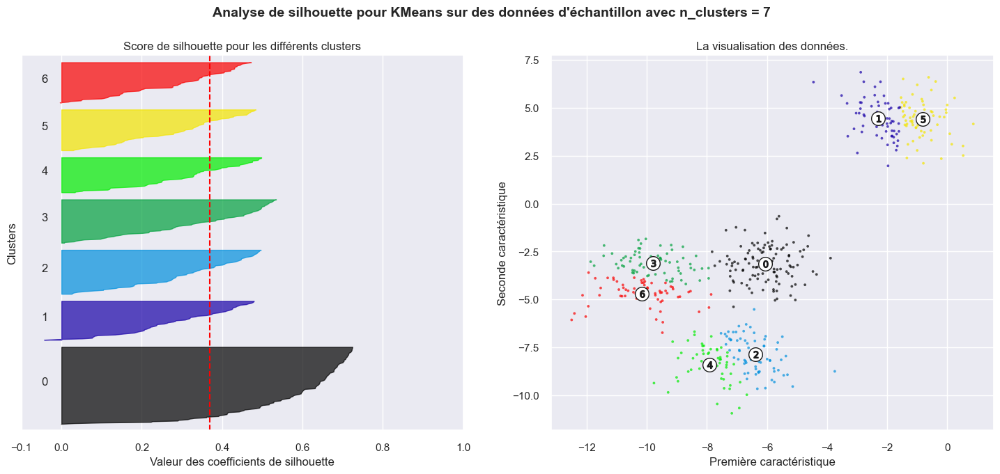

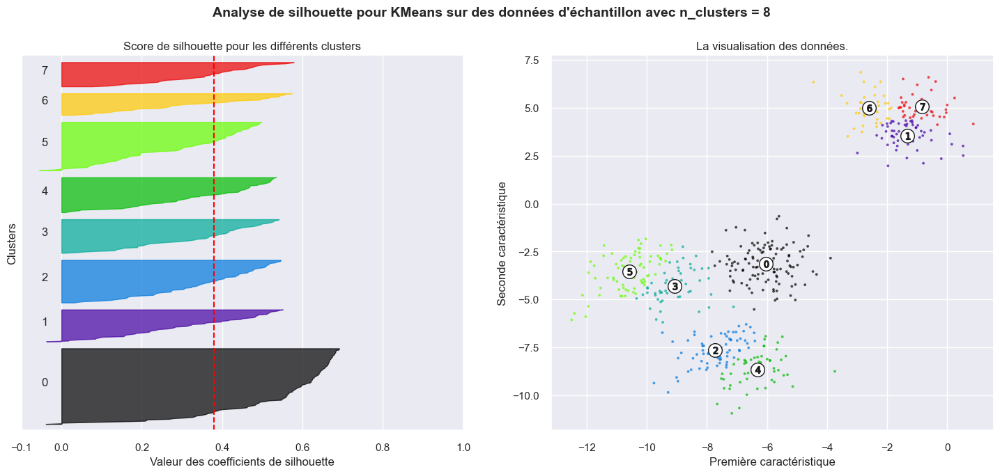

In [88]:
silhouettes(df_wk5_lf, [3,7,8])

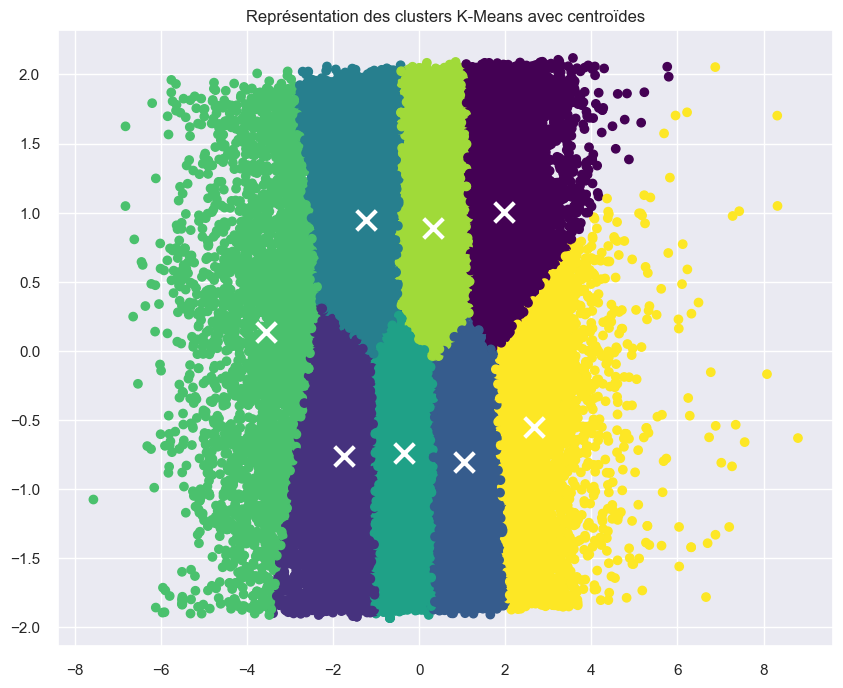

In [89]:
# Charger les données
df = df_wk5

# Appliquer PCA pour réduire la dimensionnalité des données à 2
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df)
df_pca = pd.DataFrame(df_pca, columns=['PC1', 'PC2'])

# Appliquer K-Means pour obtenir les segments/clusters
kmeans = KMeans(n_clusters=8, init='k-means++', random_state=42)
kmeans.fit(df_pca)
df_pca['Segment_K_means'] = kmeans.labels_
df_segm_analysis = df_pca.groupby(['Segment_K_means']).mean()

# Afficher la représentation graphique avec les centroïdes
fig, ax = plt.subplots(figsize=(10,8))
scatter = ax.scatter(df_pca['PC1'], df_pca['PC2'], c=df_pca['Segment_K_means'], cmap='viridis')
centroids = kmeans.cluster_centers_
ax.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=200, linewidths=3, color='white')
plt.title("Représentation des clusters K-Means avec centroïdes")
plt.show()


In [90]:
df_wk5 =df_wk5_lf.drop(columns =['pca1', 'pca2', 'member', 'cluster_number_for_8_clusters_weight', 'cluster_number_for_4_clusters', 'cluster_number_for_7_clusters','cluster_number_for_8_clusters'], axis=0)

#### Interpretation des clusters

##### Heatmap

In [91]:
df_wk5.corr()

,price,payment_type_boleto,payment_type_credit_card,review_score_1.0,review_score_3.0,review_score_4.0,review_score_5.0,payment_installments_1.0,payment_installments_2.0,nb_articles_1,nb_articles_2
price,1.00000,-0.06292,0.08803,0.01095,-0.01073,-0.00006,0.00177,-0.28408,-0.00664,0.09991,-0.06435
payment_type_boleto,-0.06292,1.00000,-0.81936,-0.00528,0.00349,0.00157,0.00105,0.47844,-0.17724,0.06506,-0.04267
payment_type_credit_card,0.08803,-0.81936,1.00000,0.00313,-0.00429,0.00118,0.00112,-0.58391,0.21631,0.11894,-0.03787
review_score_1.0,0.01095,-0.00528,0.00313,1.00000,-0.10409,-0.17001,-0.41202,-0.02711,-0.01225,-0.13257,0.08539
review_score_3.0,-0.01073,0.00349,-0.00429,-0.10409,1.00000,-0.14654,-0.35515,-0.00721,0.00232,-0.01968,0.02179
review_score_4.0,-0.00006,0.00157,0.00118,-0.17001,-0.14654,1.00000,-0.58007,0.01078,0.00765,0.03784,-0.03390
review_score_5.0,0.00177,0.00105,0.00112,-0.41202,-0.35515,-0.58007,1.00000,0.01638,0.00179,0.08689,-0.05387
payment_installments_1.0,-0.28408,0.47844,-0.58391,-0.02711,-0.00721,0.01078,0.01638,1.00000,-0.37046,-0.05128,0.01117
payment_installments_2.0,-0.00664,-0.17724,0.21631,-0.01225,0.00232,0.00765,0.00179,-0.37046,1.00000,0.05697,-0.02739
nb_articles_1,0.09991,0.06506,0.11894,-0.13257,-0.01968,0.03784,0.08689,-0.05128,0.05697,1.00000,-0.79453


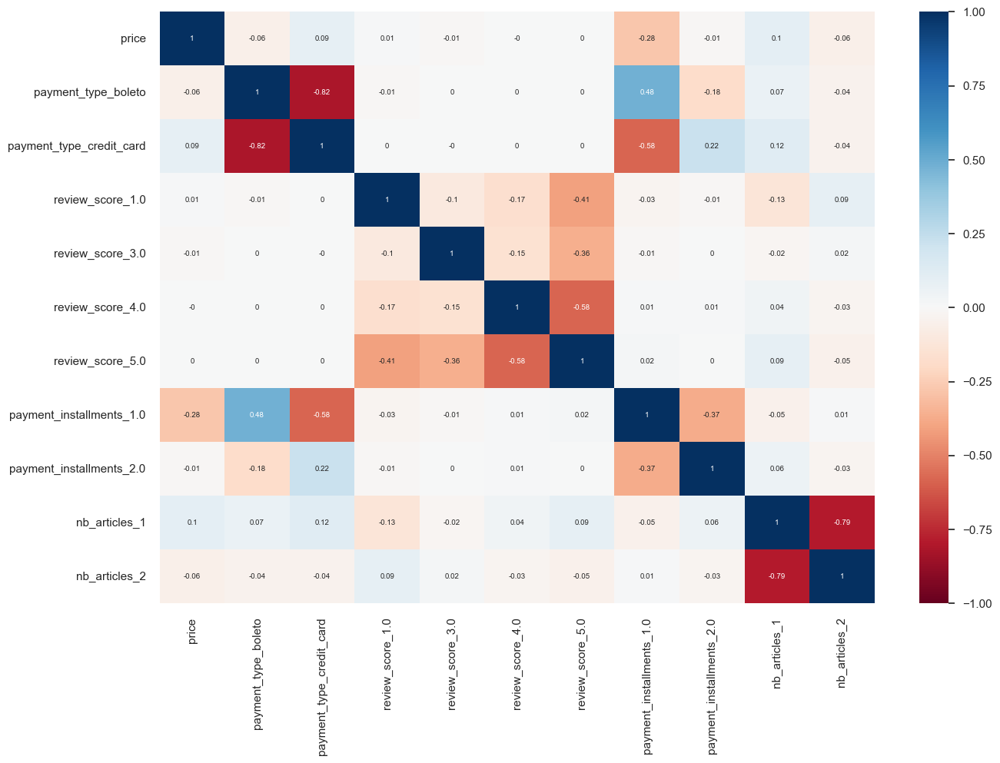

In [92]:
#On donne un aspect graphique à nos valeurs de corrélation
plt.figure(figsize=(15,10))
correlations = df_wk5.corr()
sns.heatmap(round(correlations,2), cmap='RdBu', annot=True,
            annot_kws={"size": 7}, vmin=-1, vmax=1);

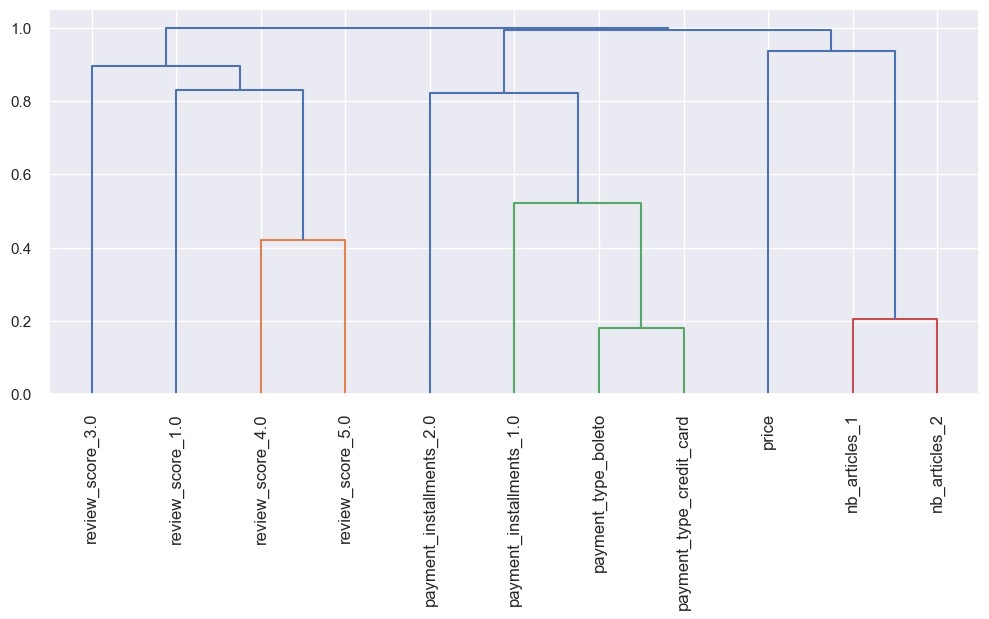

In [93]:
plt.figure(figsize=(12,5))
dissimilarity = 1 - abs(correlations)
Z = linkage(squareform(dissimilarity), 'complete')

dendrogram(Z, labels=df_wk5.columns, orientation='top',
           leaf_rotation=90);

In [94]:
# Clusterisation des données
threshold = 0.4
labels = fcluster(Z, threshold, criterion='distance')

# On montre les clusters
labels

array([9, 5, 5, 3, 4, 1, 2, 6, 7, 8, 8], dtype=int32)

In [95]:
# On concerve les etiquettes
labels_order = np.argsort(labels)

# On crée un nouveau dataframe 
for idx, i in enumerate(df_wk5.columns[labels_order]):
    if idx == 0:
        clustered = pd.DataFrame(df_wk5[i])
    else:
        df_to_append = pd.DataFrame(df_wk5[i])
        clustered = pd.concat([clustered, df_to_append], axis=1)

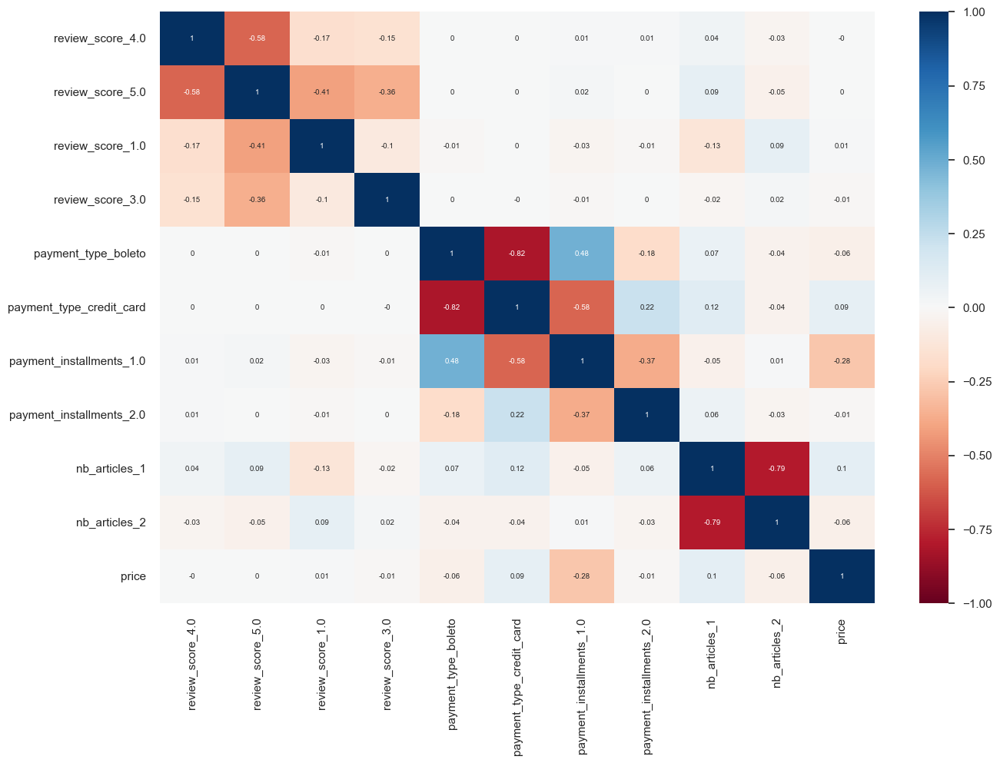

In [96]:
plt.figure(figsize=(15,10))
correlations = clustered.corr()
sns.heatmap(round(correlations,2), cmap='RdBu', annot=True,
            annot_kws={"size": 7}, vmin=-1, vmax=1);

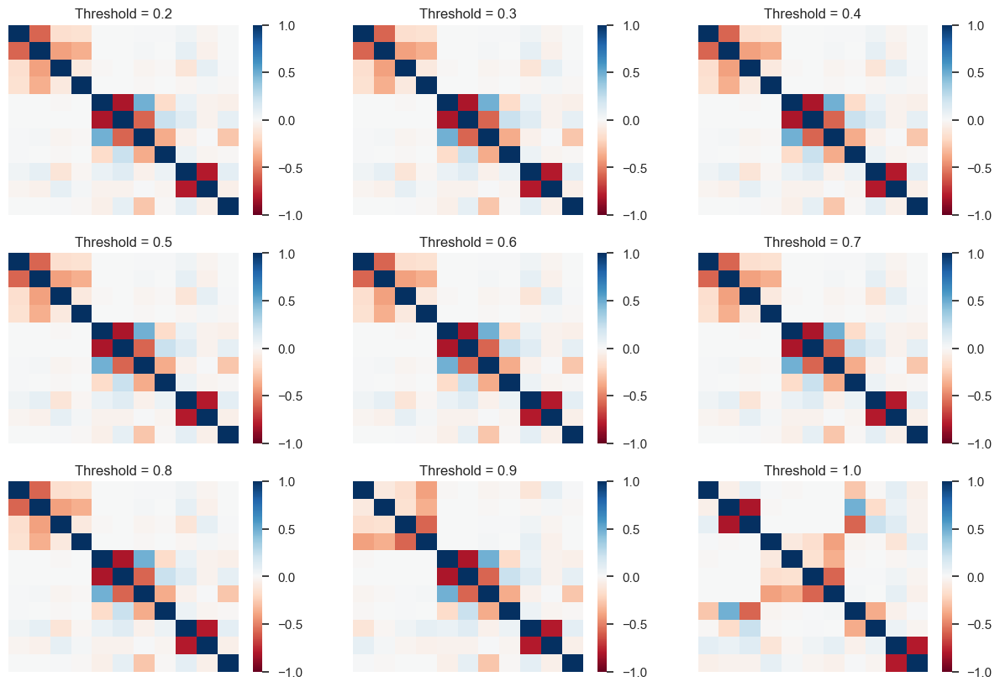

In [97]:
plt.figure(figsize=(15,10))

for idx, t in enumerate(np.arange(0.2,1.1,0.1)):

    plt.subplot(3, 3, idx+1)

    # calcul du cluster
    labels = fcluster(Z, t, criterion='distance')

    labels_order = np.argsort(labels)

    for idx, i in enumerate(df_wk5.columns[labels_order]):
        if idx == 0:
            clustered = pd.DataFrame(df_wk5[i])
        else:
            df_to_append = pd.DataFrame(df_wk5[i])
            clustered = pd.concat([clustered, df_to_append], axis=1)

    # Plot la heatmap de correlation
    correlations = clustered.corr()
    sns.heatmap(round(correlations,2), cmap='RdBu', vmin=-1, vmax=1,
                xticklabels=False, yticklabels=False)
    plt.title("Threshold = {}".format(round(t,2)))

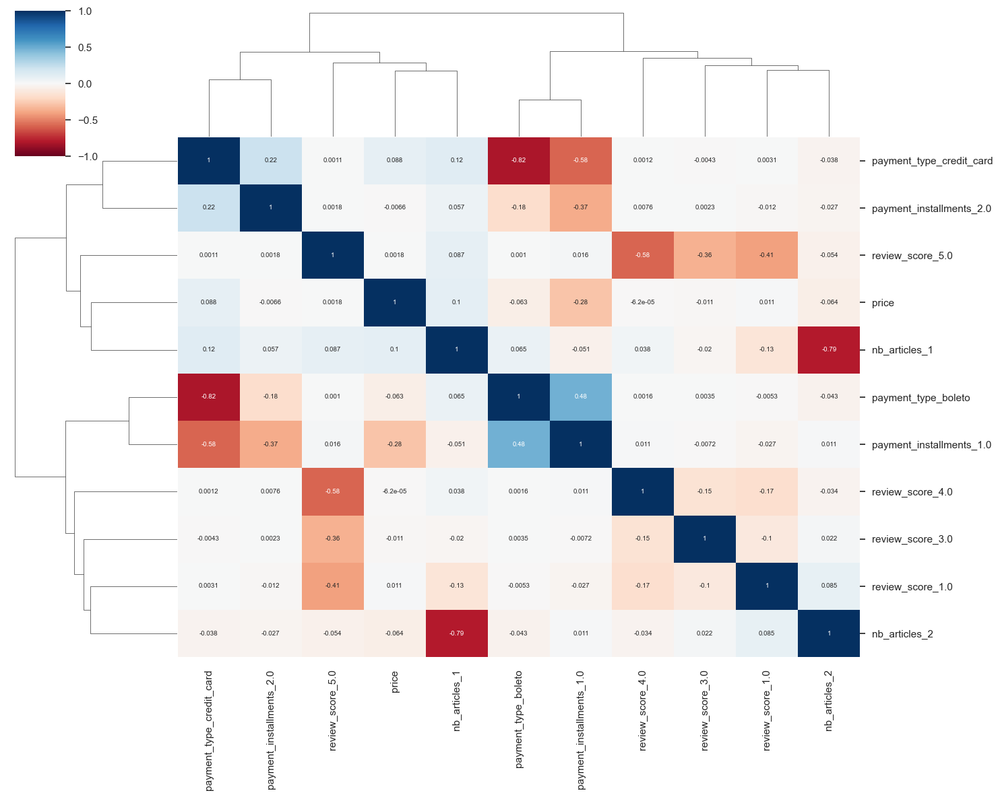

In [98]:
sns.clustermap(correlations, method="complete", cmap='RdBu', annot=True,
               annot_kws={"size": 7}, vmin=-1, vmax=1, figsize=(15,12));

### A partir des Kmedoids

In [99]:
df_wk5_lf

,price,payment_type_boleto,payment_type_credit_card,review_score_1.0,review_score_3.0,review_score_4.0,review_score_5.0,payment_installments_1.0,payment_installments_2.0,nb_articles_1,nb_articles_2,cluster_number_for_4_clusters,cluster_number_for_7_clusters,cluster_number_for_8_clusters,pca1,pca2,member,cluster_number_for_8_clusters_weight
0,-1.22718,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,3,1,7,3.53464,-2.77298,1,0.08728
1,0.94496,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2,3,5,1.99527,0.28551,1,0.14120
2,0.78409,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,2,6,0,-1.28655,4.56438,1,0.08839
3,-1.13731,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,3,1,7,3.26315,-3.04347,1,0.08728
4,1.00546,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2,6,0,-1.23720,4.61532,1,0.08839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64062,-0.57321,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1,4,4,1.36818,1.15571,1,0.12389
64063,-0.15137,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,0,1,-3.29760,-1.51410,1,0.18701
64064,-0.28051,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0,0,1,-3.28912,-1.55686,1,0.18701
64065,2.21559,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2,3,5,1.97895,0.69549,1,0.14120


In [100]:
df_wk5 =df_wk5_lf.drop(columns =['pca1', 'pca2', 'member', 'cluster_number_for_8_clusters_weight', 'cluster_number_for_4_clusters', 'cluster_number_for_7_clusters', 'cluster_number_for_8_clusters'], axis=0)

In [101]:
df_wk5_sample = df_wk5.sample(n=10000, random_state=42)

In [102]:
# Mise à l'echelle des donnés
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(df_wk5_sample)

# Clusterisation des données en utilisant la methode des Kmedois
kmedoids = KMedoids(n_clusters=8, random_state=42)
kmedoids.fit(X_scaled)
labels = kmedoids.labels_

# Calculer l'écart absolu moyen de chaque feature par rapport au centre pour chaque cluster
mad = []
for i in range(8):
    cluster_idx = np.where(labels == i)
    cluster_data = X_scaled[cluster_idx]
    cluster_centroid = X_scaled[kmedoids.medoid_indices_[i]]
    mad.append(np.mean(np.abs(cluster_data - cluster_centroid), axis=0))

# Tri des caractéristiques selon leur écart absolu moyen moyen à travers les clusters
avg_mad = np.mean(mad, axis=0)
sorted_features = np.argsort(avg_mad)[::-1]

# Feature importances pour chaque cluster
for i in range(8):
    cluster_importances = mad[i][sorted_features]
    print(f"Cluster {i}:")
    for j in range(len(sorted_features)):
        feature_idx = sorted_features[j]
        feature_importance = cluster_importances[j]
        feature_name = df_wk5.columns[feature_idx]
        print(f"\t{feature_name}: {feature_importance:.4f}")

    # Export des feature importances dans des fichiers CSV
    filename = f"cluster_{i}_importances.csv"
    feature_importances = pd.DataFrame({'feature': df_wk5.columns[sorted_features], 'importance': cluster_importances})
    feature_importances.to_csv(filename, index=False)
    print(f"Feature importances saved to {filename}")


Cluster 0:
	review_score_5.0: 0.4099
	review_score_4.0: 0.1662
	nb_articles_1: 0.3096
	payment_installments_2.0: 0.3020
	nb_articles_2: 0.2157
	payment_type_credit_card: 0.0000
	review_score_1.0: 0.1332
	payment_type_boleto: 0.0000
	review_score_3.0: 0.0825
	price: 0.0461
	payment_installments_1.0: 0.0000
Feature importances saved to cluster_0_importances.csv
Cluster 1:
	review_score_5.0: 0.4325
	review_score_4.0: 0.2055
	nb_articles_1: 0.2076
	payment_installments_2.0: 0.2924
	nb_articles_2: 0.1544
	payment_type_credit_card: 0.0000
	review_score_1.0: 0.1135
	payment_type_boleto: 0.0000
	review_score_3.0: 0.0828
	price: 0.0192
	payment_installments_1.0: 0.0000
Feature importances saved to cluster_1_importances.csv
Cluster 2:
	review_score_5.0: 0.4096
	review_score_4.0: 0.1951
	nb_articles_1: 0.1253
	payment_installments_2.0: 0.1447
	nb_articles_2: 0.0943
	payment_type_credit_card: 0.0000
	review_score_1.0: 0.1072
	payment_type_boleto: 0.0000
	review_score_3.0: 0.0788
	price: 0.0159
	pa

In [103]:

# Calculer les coordonnées pour les graphiques en radar
radar_data = []
for i in range(8):
    cluster_idx = np.where(labels == i)
    cluster_data = X_scaled[cluster_idx]
    cluster_centroid = X_scaled[kmedoids.medoid_indices_[i]]
    values = np.mean(np.abs(cluster_data - cluster_centroid), axis=0)[sorted_features]
    radar_data.append(go.Scatterpolar(
        r=values,
        theta=df_wk5.columns[sorted_features],
        fill='toself',
        name=f"Cluster {i}"
    ))

# Afficher les graphiques en radar
fig = go.Figure(radar_data)
fig.update_layout(
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 1]
        )),
    showlegend=True,
    height=800, # Modifier la hauteur de la figure ici
    width=800 # Modifier la largeur de la figure ici
)
fig.show()


Cluster 0: les clients dans ce cluster ont tendance à donner des notes élevées (5.0) et à acheter des articles en petite quantité (1). Ils utilisent souvent un paiement en deux fois (installments_2.0). Le type de paiement utilisé n'est pas précisé (crédit ou boleto), mais les paiements en une fois ne sont pas utilisés. La variable de prix a une importance relative moyenne.

Cluster 1: les clients de ce cluster ont des caractéristiques similaires à ceux du Cluster 0, mais ils achètent un peu plus d'articles en petite quantité (1), et utilisent également souvent un paiement en deux fois (installments_2.0). La variable de prix a une importance relative faible.

Cluster 2: les clients de ce cluster ont des notes de satisfaction un peu moins élevées (5.0), et achètent en moyenne un peu moins d'articles en petite quantité (1). Ils utilisent également souvent un paiement en deux fois (installments_2.0), mais les autres caractéristiques ne sont pas clairement distinctes. La variable de prix a une importance relative faible.

Cluster 3: les clients de ce cluster ont des notes de satisfaction similaires à celles des Clusters 0 et 1 (5.0), mais ils achètent en moyenne plus d'articles en petite quantité (1), et utilisent presque exclusivement le paiement par carte de crédit. Ils ont également tendance à utiliser le paiement en une fois (installments_1.0) plutôt que le paiement en deux fois. La variable de prix a une importance relative moyenne.

Cluster 4: les clients de ce cluster ont des notes de satisfaction similaires à celles des Clusters 0, 1 et 3 (5.0), mais ils achètent en moyenne un peu moins d'articles en petite quantité (1) et ont tendance à utiliser le paiement en deux fois (installments_2.0). La variable de prix a une importance relative faible.

Cluster 5 : Les clients de ce cluster ont tendance à donner des notes de 4 ou 5 étoiles, à acheter principalement des articles de catégorie 1 et à payer en plusieurs fois avec un paiement en 2 fois. Ils n'utilisent pas beaucoup de cartes de crédit et de boleto comme moyen de paiement, et le prix ne semble pas être un facteur important pour eux.

Cluster 6 : Les clients de ce cluster ont également tendance à donner des notes de 4 ou 5 étoiles, à acheter principalement des articles de catégorie 1 et 2, et à payer principalement par carte de crédit ou boleto. Ils n'utilisent pas beaucoup de paiements en plusieurs fois et le prix semble être un facteur important pour eux.

Cluster 7 : Les clients de ce cluster ont tendance à donner des notes variées, avec une proportion plus faible de notes élevées (4 et 5 étoiles). Ils achètent principalement des articles de catégorie 1, et utilisent principalement un paiement en 2 fois avec une carte de crédit. Ils ont une proportion importante de notes de 1 étoile et utilisent peu le boleto comme moyen de paiement.

------


Cluster 0 "Grands acheteurs": Ce cluster est caractérisé par un grand nombre d'articles achetés et un prix élevé.

Cluster 1 "Payeurs fréquents": Les clients de ce cluster ont tendance à choisir des plans de paiement en plusieurs fois et à utiliser principalement des cartes de crédit.

Cluster 2 "Acheteurs réguliers": Ce cluster est caractérisé par des clients qui achètent un nombre modéré d'articles avec des scores de révision moyens à élevés.

Cluster 3 "Clients exigeants" : Les clients de ce cluster ont des attentes élevées en termes de score de révision (4 ou 5 étoiles) mais ont également acheté un grand nombre d'articles.

Cluster 4 "Acheteurs occasionnels": Ce cluster est caractérisé par des clients qui achètent un petit nombre d'articles avec des scores de révision élevés à moyens.

Cluster 5 "Faibles scores de revue": Les clients de ce cluster ont tendance à donner des scores de revue moyens à bas. Ils ont également tendance à acheter un petit nombre d'articles et à utiliser des plans de paiement en une seule fois.

Cluster 6 "Acheteurs au comptant": Les clients de ce cluster ont tendance à utiliser le mode de paiement billet et à donner des scores de révision élevés à moyens. Ils ont également tendance à acheter un nombre modéré d'articles.

Cluster 7 "Faibles achats": Les clients de ce cluster ont tendance à acheter un petit nombre d'articles avec des scores de révision moyens à bas. Ils ont également tendance à utiliser des plans de paiement en plusieurs fois.


### Sauvegarde du modèle

In [104]:
# Ajout de la feature temporelle 'order_purchase_timestamp'
df_wk5_model = pd.concat([df_wk5, data_clean['order_purchase_timestamp']], axis=1)

In [105]:
df_wk5_model.to_csv('/Users/xparisot/Formation OpenClassRoom/Projets/Projet 5/df_final.csv', index=False)

## DBSCAN avec jeu de données finales df_wk5

Pour l'algorithme DBSCAN, il faut déterminer 2 paramètres:

min_samples : le plus petit nombre de points requis pour former un cluster.
eps (epsilon) : la distance maximale entre deux points appartenant à un même cluster.
Pour le paramètre eps, nous allons le déterminer en calculant la distance moyenne entre chaque point et ses plus proches voisins à l'aide de NearestNeighbors.


### Echantillonage du jeu de données

In [106]:
df_wk5_sample = df_wk5.sample(n=10000, random_state=42)

The optimal value of epsilon is 1.000


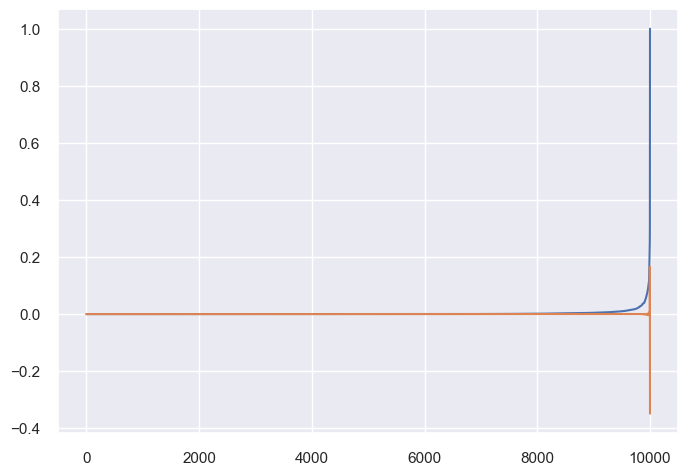

In [107]:
# Scale your data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(df_wk5_sample)

# Compute the distances to k-th nearest neighbors
k = 4  # the minimum number of points required to form a cluster
neigh = NearestNeighbors(n_neighbors=k)
neigh.fit(X_scaled)
distances, indices = neigh.kneighbors(X_scaled)

# Sort the distances and plot them
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

# Find the elbow point
knee = np.gradient(np.gradient(distances))
plt.plot(knee)

eps = distances[np.argmin(knee)]
print(f"The optimal value of epsilon is {eps:.3f}")

In [108]:
# Create a numpy array from the DataFrame
X = np.array(df_wk5_sample)

# Instantiate the DBSCAN object with your desired hyperparameters
dbscan = DBSCAN(eps=1.050, min_samples=5)

# Fit the DBSCAN object to your data
dbscan.fit(X)

# Get the cluster labels for each data point
labels = dbscan.labels_

# Print the number of clusters found by DBSCAN
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print(f"Number of clusters found by DBSCAN: {n_clusters}")

Number of clusters found by DBSCAN: 1


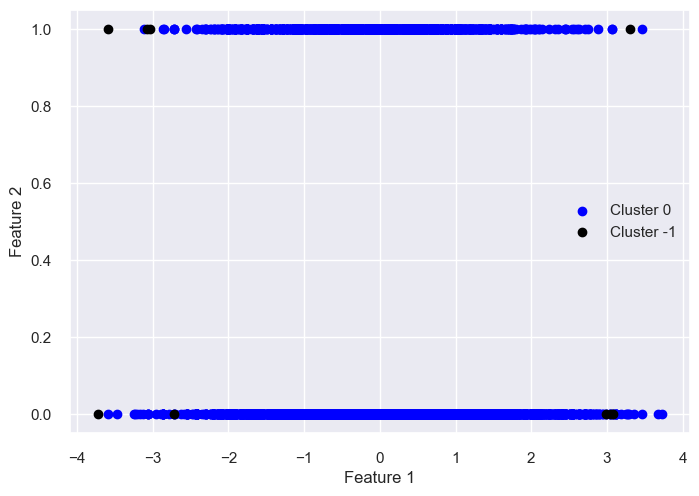

In [109]:
# Define the colors to use for the plot
colors = ['blue', 'green', 'orange', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Create a scatter plot of the data points, colored by cluster label
for i, label in enumerate(set(labels)):
    if label == -1:
        # Data points that are not assigned to any cluster are labeled as -1
        color = 'black'
    else:
        # Assign a color to each cluster label
        color = colors[label % len(colors)]
    # Select data points that belong to the current cluster label
    mask = labels == label
    # Plot the data points for the current cluster label
    plt.scatter(X[mask, 0], X[mask, 1], c=color, label=f'Cluster {label}')

# Add axis labels and a legend to the plot
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Show the plot
plt.show()

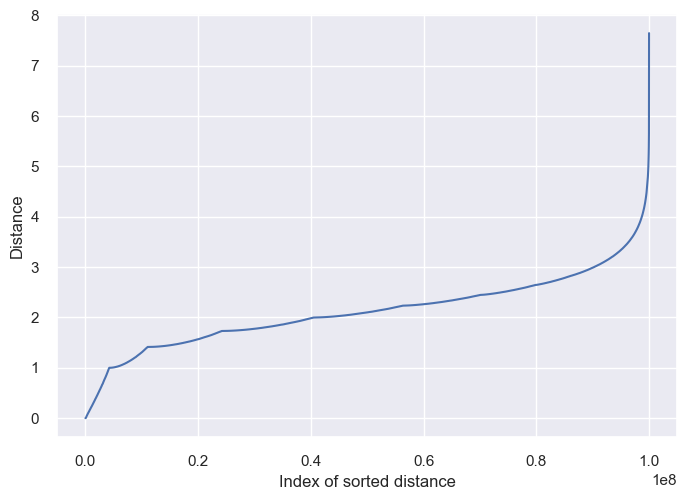

The optimal value of epsilon is 7.334
Number of clusters found by DBSCAN: 1


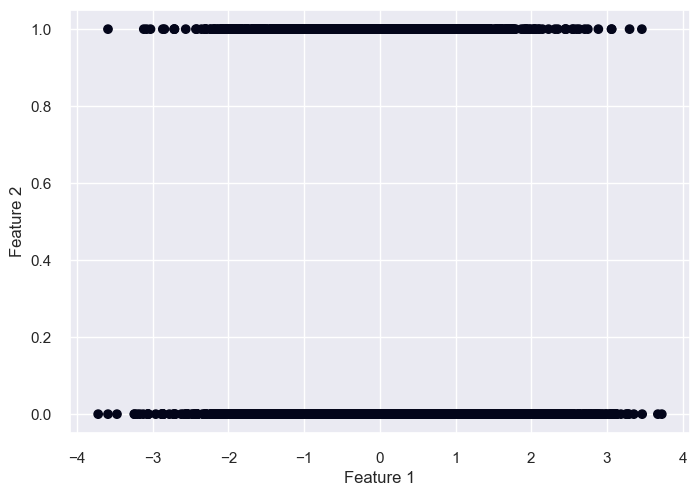

In [110]:
# Compute the pairwise distances between all points in the dataset
distances = pairwise_distances(df_wk5_sample)

# Sort the distances in ascending order
sorted_distances = np.sort(distances.ravel())

# Plot the sorted distances
plt.plot(sorted_distances)
plt.xlabel('Index of sorted distance')
plt.ylabel('Distance')
plt.show()

# Determine the value of epsilon to use in DBSCAN
knee = np.argmax(np.diff(sorted_distances))
eps = sorted_distances[knee]

print(f"The optimal value of epsilon is {eps:.3f}")

# Instantiate the DBSCAN object with the chosen value of epsilon and other hyperparameters
dbscan = DBSCAN(eps=eps, min_samples=5)

# Fit the DBSCAN object to the data
dbscan.fit(df_wk5_sample)

# Get the cluster labels for each point
labels = dbscan.labels_

# Print the number of clusters found by DBSCAN
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print(f"Number of clusters found by DBSCAN: {n_clusters}")

# Plot the clusters as circles centered on their centroids
centroids = []
for i in range(n_clusters):
    # Compute the centroid of each cluster
    centroid = np.mean(df_wk5_sample[labels == i], axis=0)
    centroids.append(centroid)
    # Plot the circle centered on the centroid
    circle = plt.Circle(centroid, eps, color='b', fill=False)
    plt.gca().add_artist(circle)

# Plot the data points
plt.scatter(df_wk5_sample.values[:, 0], df_wk5_sample.values[:, 1], c=labels)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

## Gaussian Mixture Model

In [111]:
X = df_wk5

In [112]:
df_wk5.columns

Index(['price', 'payment_type_boleto', 'payment_type_credit_card',
       'review_score_1.0', 'review_score_3.0', 'review_score_4.0',
       'review_score_5.0', 'payment_installments_1.0',
       'payment_installments_2.0', 'nb_articles_1', 'nb_articles_2'],
      dtype='object')

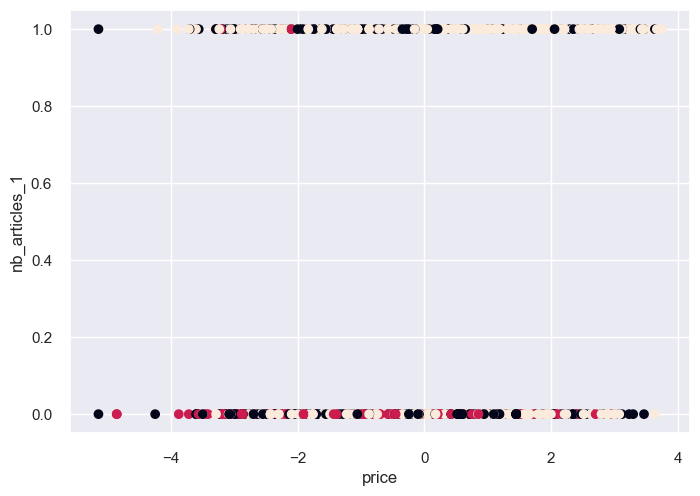

In [113]:
# create a list of all features
features = ['price', 'payment_type_boleto', 'payment_type_credit_card',
            'review_score_1.0', 'review_score_3.0', 'review_score_4.0',
            'review_score_5.0', 'payment_installments_1.0',
            'payment_installments_2.0', 'nb_articles_1', 'nb_articles_2']

# instantiate the Gaussian Mixture model with 3 components
gmm = GaussianMixture(n_components=3)

# fit the model to the data
gmm.fit(df_wk5[features])

# predict the clusters for each data point
labels = gmm.predict(df_wk5[features])

# plot the results
plt.scatter(df_wk5['price'], df_wk5['nb_articles_1'], c=labels)
plt.xlabel('price')
plt.ylabel('nb_articles_1')
plt.show()

Number of clusters found by GMM: 6


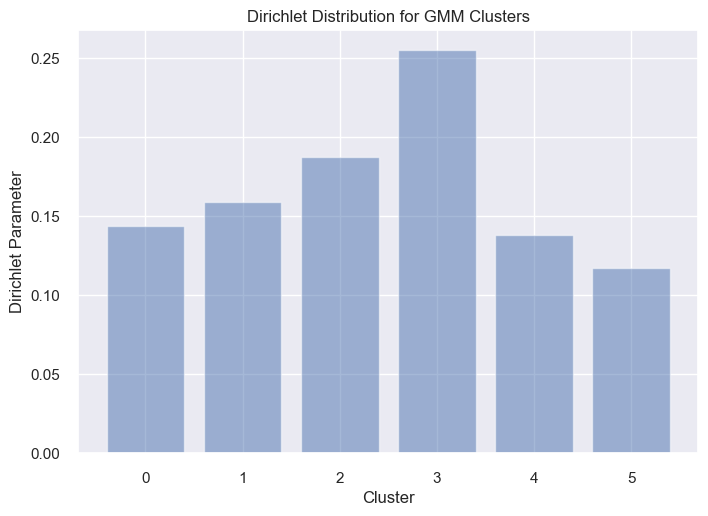

In [114]:
# Define the number of clusters and maximum number of iterations
n_components = 6
max_iter = 500

# Scale your data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(df_wk5)

# Instantiate the BayesianGaussianMixture object with your desired hyperparameters
gmm = BayesianGaussianMixture(n_components=n_components, max_iter=max_iter, weight_concentration_prior=0.1)

# Fit the BayesianGaussianMixture object to your data
gmm.fit(X_scaled)

# Get the cluster labels for each data point
labels = gmm.predict(X_scaled)

# Print the number of clusters found by GMM
n_clusters = len(set(labels))
print(f"Number of clusters found by GMM: {n_clusters}")

# Plot the Dirichlet distribution for each cluster
dirichlet_params = gmm.weights_
plt.bar(range(n_components), dirichlet_params, alpha=0.5)
plt.title('Dirichlet Distribution for GMM Clusters')
plt.xlabel('Cluster')
plt.ylabel('Dirichlet Parameter')
plt.show()


In [115]:
# Scale your data
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(df_wk5)

# Instantiate the GaussianMixture object with your desired hyperparameters
n_components = 6
covariance_type = 'full'
gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42, n_init=10, max_iter=100, init_params='kmeans', tol=1e-4, verbose=0, verbose_interval=10, warm_start=False, reg_covar=1e-6)

# Fit the GaussianMixture object to your data
gmm.fit(X_scaled)

# Get the cluster labels for each data point
labels = gmm.predict(X_scaled)

# Get the probabilities of each data point belonging to each cluster
probs = gmm.predict_proba(X_scaled)

# Compute the mean absolute deviation of each feature from the centroid for each cluster
mad = []
for i in range(n_components):
    cluster_idx = np.where(labels == i)
    cluster_data = X_scaled[cluster_idx]
    cluster_mean = gmm.means_[i]
    mad.append(np.mean(np.abs(cluster_data - cluster_mean), axis=0))

# Sort the features by their average MAD across clusters
avg_mad = np.mean(mad, axis=0)
sorted_features = np.argsort(avg_mad)[::-1]

# Print the feature importances for each cluster
for i in range(n_components):
    cluster_importances = mad[i][sorted_features]
    print(f"Cluster {i}:")
    for j in range(len(sorted_features)):
        feature_idx = sorted_features[j]
        feature_importance = cluster_importances[j]
        feature_name = df_wk5.columns[feature_idx]
        print(f"\t{feature_name}: {feature_importance:.4f}")

Cluster 0:
	payment_installments_1.0: 0.0000
	review_score_1.0: 0.0000
	payment_installments_2.0: 0.3742
	payment_type_boleto: 0.0000
	review_score_3.0: 0.0000
	nb_articles_1: 0.0704
	payment_type_credit_card: 0.0000
	review_score_4.0: 0.0000
	price: 0.0829
	review_score_5.0: 0.0000
	nb_articles_2: 0.0000
Cluster 1:
	payment_installments_1.0: 0.0000
	review_score_1.0: 0.3796
	payment_installments_2.0: 0.0000
	payment_type_boleto: 0.3948
	review_score_3.0: 0.3229
	nb_articles_1: 0.4332
	payment_type_credit_card: 0.0000
	review_score_4.0: 0.4971
	price: 0.0889
	review_score_5.0: 0.0000
	nb_articles_2: 0.2842
Cluster 2:
	payment_installments_1.0: 0.4931
	review_score_1.0: 0.2583
	payment_installments_2.0: 0.1999
	payment_type_boleto: 0.1571
	review_score_3.0: 0.1468
	nb_articles_1: 0.0000
	payment_type_credit_card: 0.3063
	review_score_4.0: 0.2217
	price: 0.0853
	review_score_5.0: 0.4810
	nb_articles_2: 0.0000
Cluster 3:
	payment_installments_1.0: 0.4511
	review_score_1.0: 0.0000
	payment

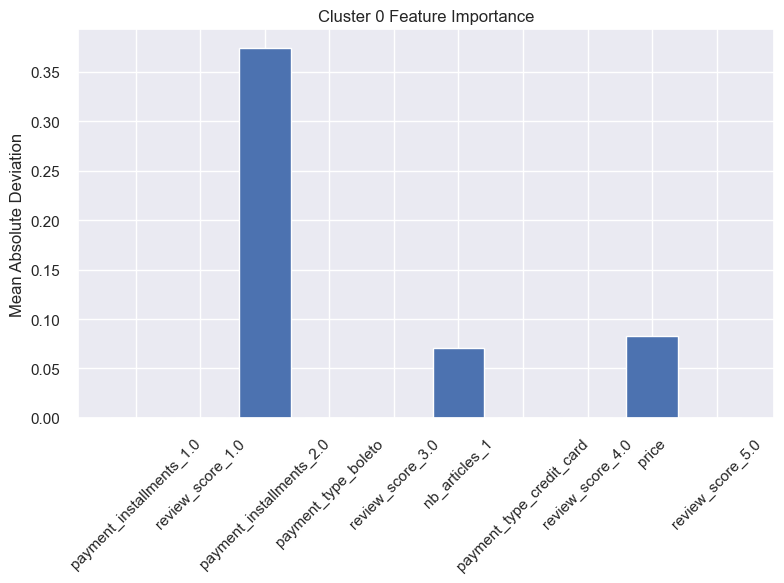

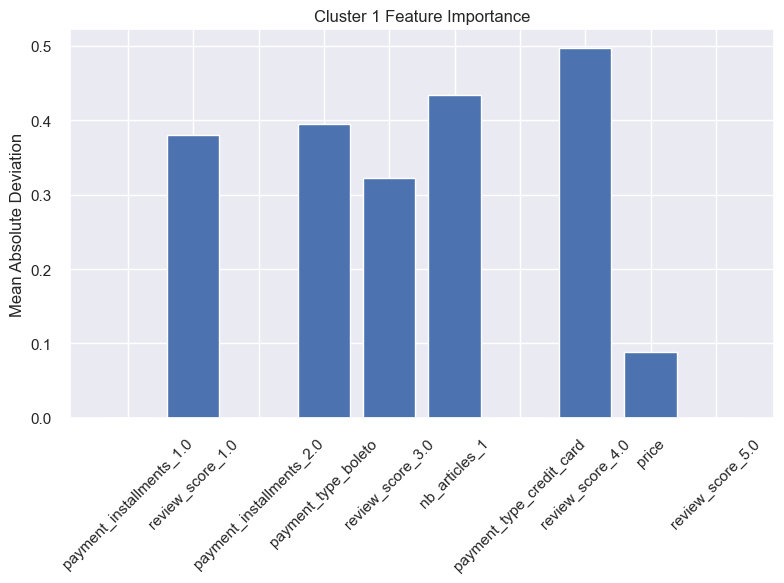

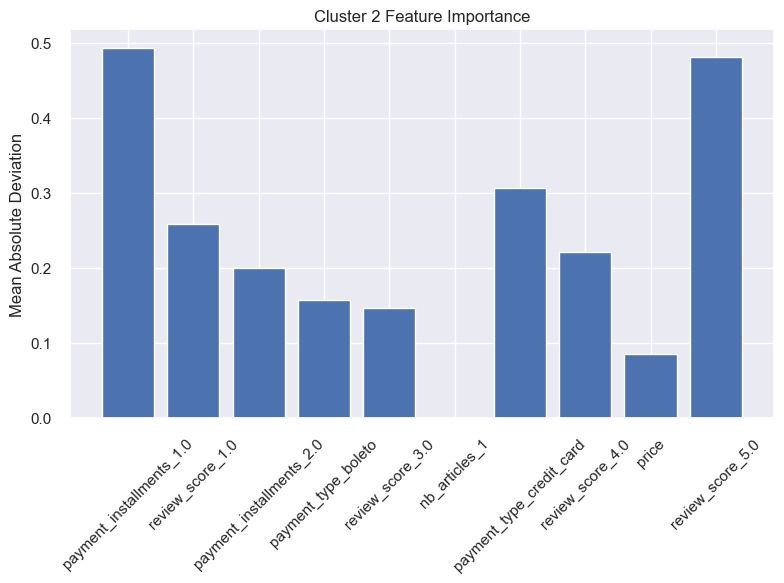

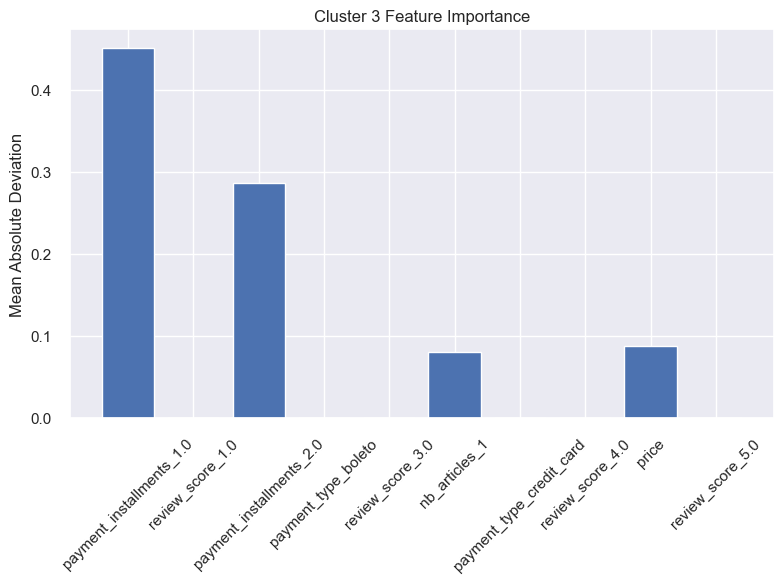

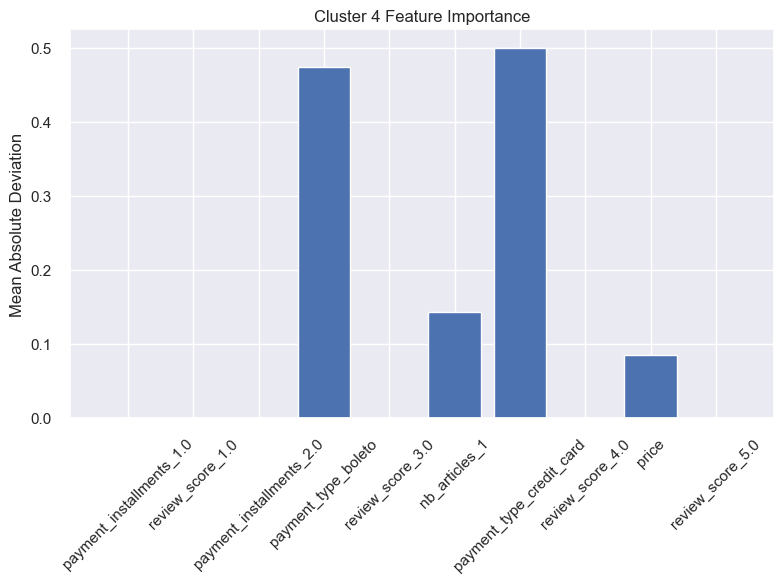

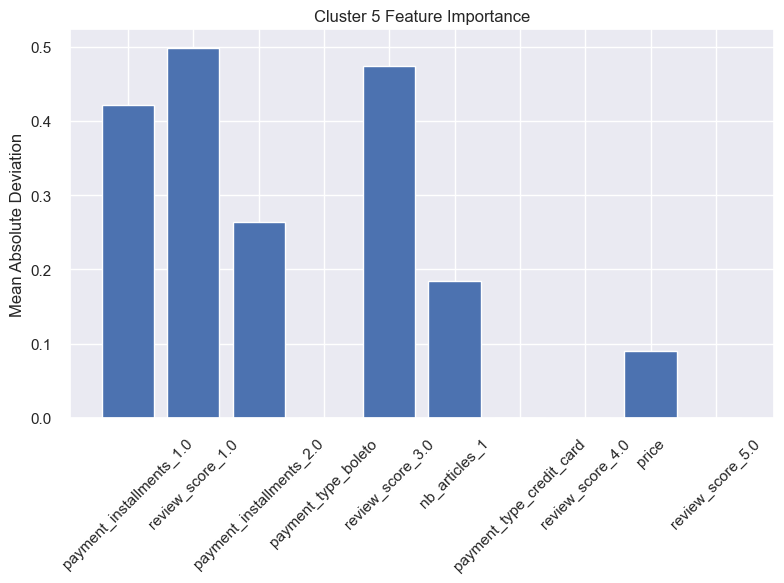

In [116]:
# Set the number of top features to plot
top_n = 10

# Loop over each cluster
for i in range(n_components):
    # Get the feature importances for the current cluster
    cluster_importances = mad[i][sorted_features][:top_n]
    feature_names = df_wk5.columns[sorted_features][:top_n]

    # Create a barplot of the top features for the current cluster
    plt.figure(figsize=(8,6))
    plt.bar(feature_names, cluster_importances)
    plt.title(f"Cluster {i} Feature Importance")
    plt.xticks(rotation=45)
    plt.ylabel("Mean Absolute Deviation")
    plt.tight_layout()
    plt.show()